#Import Dependencies

In [ ]:
!pip install folium
!pip install geopy
!pip install plotly
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install seaborn
!pip install requests
!pip install urllib
!pip install time
!pip install calendar

ERROR: Could not find a version that satisfies the requirement urllib (from versions: none)
ERROR: No matching distribution found for urllib
ERROR: Could not find a version that satisfies the requirement time (from versions: none)
ERROR: No matching distribution found for time
ERROR: Could not find a version that satisfies the requirement calendar (from versions: none)
ERROR: No matching distribution found for calendar


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime
import calendar

#Downloading Data

###Millwood

In [ ]:
import requests
import pandas as pd
import urllib.parse
import time

API_KEY = "yuCbDpVDZlCEzBK5A19EO5fyshMU8jVmXD6O7zUW"
EMAIL = "om.sanan007@gmail.com"
BASE_URL = "https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-2-2-download.json?"
POINTS = [
'1250350'
]

def main():
    input_data = {
        'attributes': 'air_temperature,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_type,dew_point,dhi,dni,fill_flag,ghi,relative_humidity,solar_zenith_angle,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,ghuv-280-400,ghuv-295-385',
        'interval': '60',
        'to_utc': 'false',

        'api_key': API_KEY,
        'email': EMAIL,
    }
    for name in ['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
        print(f"Processing name: {name}")
        for id, location_ids in enumerate(POINTS):
            input_data['names'] = [name]
            input_data['location_ids'] = location_ids
            print(f'Making request for point group {id + 1} of {len(POINTS)}...')

            if '.csv' in BASE_URL:
                url = BASE_URL + urllib.parse.urlencode(data, True)
                # Note: CSV format is only supported for single point requests
                # Suggest that you might append to a larger data frame
                data = pd.read_csv(url)
                print(f'Response data (you should replace this print statement with your processing): {data}')
                # You can use the following code to write it to a file
                # data.to_csv('SingleBigDataPoint.csv')
            else:
                headers = {
                  'x-api-key': API_KEY
                }
                data = get_response_json_and_handle_errors(requests.post(BASE_URL, input_data, headers=headers))
                download_url = data['outputs']['downloadUrl']
                # You can do with what you will the download url
                print(data['outputs']['message'])
                print(f"Data can be downloaded from this url when ready: {download_url}")

                # Delay for 1 second to prevent rate limiting
                time.sleep(1)
            print(f'Processed')


def get_response_json_and_handle_errors(response: requests.Response) -> dict:
    """Takes the given response and handles any errors, along with providing
    the resulting json

    Parameters
    ----------
    response : requests.Response
        The response object

    Returns
    -------
    dict
        The resulting json
    """
    if response.status_code != 200:
        print(f"An error has occurred with the server or the request. The request response code/status: {response.status_code} {response.reason}")
        print(f"The response body: {response.text}")
        exit(1)

    try:
        response_json = response.json()
    except:
        print(f"The response couldn't be parsed as JSON, likely an issue with the server, here is the text: {response.text}")
        exit(1)

    if len(response_json['errors']) > 0:
        errors = '\n'.join(response_json['errors'])
        print(f"The request errored out, here are the errors: {errors}")
        exit(1)
    return response_json

if __name__ == "__main__":
    main()

Processing name: 2010
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/e6caf69608d45d12ca5a0b40fd5f9e59.zip
Processed
Processing name: 2011
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/581cf15ef42bf5f0e86f0175bce2abdf.zip
Processed
Processing name: 2012
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/ee45ed6e9951c12653da35c78daf0239.zip
Processed
Processing name: 2013
Making request for point group 1 of 1...
File generation in progress. An email

###Tampa

In [ ]:
import requests
import pandas as pd
import urllib.parse
import time

API_KEY = "yuCbDpVDZlCEzBK5A19EO5fyshMU8jVmXD6O7zUW"
EMAIL = "om.sanan007@gmail.com"
BASE_URL = "https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-2-2-download.json?"
POINTS = [
'1013474'
]

def main():
    input_data = {
        'attributes': 'air_temperature,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_type,dew_point,dhi,dni,fill_flag,ghi,relative_humidity,solar_zenith_angle,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,ghuv-280-400,ghuv-295-385',
        'interval': '60',
        'to_utc': 'false',

        'api_key': API_KEY,
        'email': EMAIL,
    }
    for name in ['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
        print(f"Processing name: {name}")
        for id, location_ids in enumerate(POINTS):
            input_data['names'] = [name]
            input_data['location_ids'] = location_ids
            print(f'Making request for point group {id + 1} of {len(POINTS)}...')

            if '.csv' in BASE_URL:
                url = BASE_URL + urllib.parse.urlencode(data, True)
                # Note: CSV format is only supported for single point requests
                # Suggest that you might append to a larger data frame
                data = pd.read_csv(url)
                print(f'Response data (you should replace this print statement with your processing): {data}')
                # You can use the following code to write it to a file
                # data.to_csv('SingleBigDataPoint.csv')
            else:
                headers = {
                  'x-api-key': API_KEY
                }
                data = get_response_json_and_handle_errors(requests.post(BASE_URL, input_data, headers=headers))
                download_url = data['outputs']['downloadUrl']
                # You can do with what you will the download url
                print(data['outputs']['message'])
                print(f"Data can be downloaded from this url when ready: {download_url}")

                # Delay for 1 second to prevent rate limiting
                time.sleep(1)
            print(f'Processed')


def get_response_json_and_handle_errors(response: requests.Response) -> dict:
    """Takes the given response and handles any errors, along with providing
    the resulting json

    Parameters
    ----------
    response : requests.Response
        The response object

    Returns
    -------
    dict
        The resulting json
    """
    if response.status_code != 200:
        print(f"An error has occurred with the server or the request. The request response code/status: {response.status_code} {response.reason}")
        print(f"The response body: {response.text}")
        exit(1)

    try:
        response_json = response.json()
    except:
        print(f"The response couldn't be parsed as JSON, likely an issue with the server, here is the text: {response.text}")
        exit(1)

    if len(response_json['errors']) > 0:
        errors = '\n'.join(response_json['errors'])
        print(f"The request errored out, here are the errors: {errors}")
        exit(1)
    return response_json

if __name__ == "__main__":
    main()

Processing name: 2010
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/bbaaa9700802754c7ab24879533a4986.zip
Processed
Processing name: 2011
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/84dc8f63d9a6fe3becb522d81bfc3b55.zip
Processed
Processing name: 2012
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/6f0e0bfdef86c05f6a4ce6d817b6513b.zip
Processed
Processing name: 2013
Making request for point group 1 of 1...
File generation in progress. An email

###Almeda

In [ ]:
import requests
import pandas as pd
import urllib.parse
import time

API_KEY = "yuCbDpVDZlCEzBK5A19EO5fyshMU8jVmXD6O7zUW"
EMAIL = "om.sanan007@gmail.com"
BASE_URL = "https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-2-2-download.json?"
POINTS = [
'143791'
]

def main():
    input_data = {
        'attributes': 'air_temperature,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_type,dew_point,dhi,dni,fill_flag,ghi,relative_humidity,solar_zenith_angle,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,ghuv-280-400,ghuv-295-385',
        'interval': '60',
        'to_utc': 'false',

        'api_key': API_KEY,
        'email': EMAIL,
    }
    for name in ['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
        print(f"Processing name: {name}")
        for id, location_ids in enumerate(POINTS):
            input_data['names'] = [name]
            input_data['location_ids'] = location_ids
            print(f'Making request for point group {id + 1} of {len(POINTS)}...')

            if '.csv' in BASE_URL:
                url = BASE_URL + urllib.parse.urlencode(data, True)
                # Note: CSV format is only supported for single point requests
                # Suggest that you might append to a larger data frame
                data = pd.read_csv(url)
                print(f'Response data (you should replace this print statement with your processing): {data}')
                # You can use the following code to write it to a file
                # data.to_csv('SingleBigDataPoint.csv')
            else:
                headers = {
                  'x-api-key': API_KEY
                }
                data = get_response_json_and_handle_errors(requests.post(BASE_URL, input_data, headers=headers))
                download_url = data['outputs']['downloadUrl']
                # You can do with what you will the download url
                print(data['outputs']['message'])
                print(f"Data can be downloaded from this url when ready: {download_url}")

                # Delay for 1 second to prevent rate limiting
                time.sleep(1)
            print(f'Processed')


def get_response_json_and_handle_errors(response: requests.Response) -> dict:
    """Takes the given response and handles any errors, along with providing
    the resulting json

    Parameters
    ----------
    response : requests.Response
        The response object

    Returns
    -------
    dict
        The resulting json
    """
    if response.status_code != 200:
        print(f"An error has occurred with the server or the request. The request response code/status: {response.status_code} {response.reason}")
        print(f"The response body: {response.text}")
        exit(1)

    try:
        response_json = response.json()
    except:
        print(f"The response couldn't be parsed as JSON, likely an issue with the server, here is the text: {response.text}")
        exit(1)

    if len(response_json['errors']) > 0:
        errors = '\n'.join(response_json['errors'])
        print(f"The request errored out, here are the errors: {errors}")
        exit(1)
    return response_json

if __name__ == "__main__":
    main()

Processing name: 2010
Making request for point group 1 of 1...
An error has occurred with the server or the request. The request response code/status: 400 Bad Request
The response body: {"inputs":{"body":{"attributes":"air_temperature,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_type,dew_point,dhi,dni,fill_flag,ghi,relative_humidity,solar_zenith_angle,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,ghuv-280-400,ghuv-295-385","interval":"60","to_utc":"false","api_key":"yuCbDpVDZlCEzBK5A19EO5fyshMU8jVmXD6O7zUW","email":"om.sanan007@gmail.com","names":"2010","location_ids":"143791"},"params":{},"query":{}},"metadata":{"version":"2.0.0"},"status":400,"errors":["User currently owns 21 in-flight jobs which exceeds the maximum limit of 20 requests. Please try again when existing requests have completed."]}
The request errored out, here are the errors: User currently owns 21 in-flight jobs which exceeds the maximum limit of 20 requests. Please try again when 

KeyError: ignored

###SAWS

In [ ]:
import requests
import pandas as pd
import urllib.parse
import time

API_KEY = "TD7LZaCw8NctYBD6EPjxeLvbmxAssJ9vASPqwDTq"
EMAIL = "om.sanan007@gmail.com"
BASE_URL = "https://developer.nrel.gov/api/nsrdb/v2/solar/psm3-2-2-download.json?"
POINTS = [
'657210'
]

def main():
    input_data = {
        'attributes': 'air_temperature,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_type,dew_point,dhi,dni,fill_flag,ghi,relative_humidity,solar_zenith_angle,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,ghuv-280-400,ghuv-295-385',
        'interval': '60',
        'to_utc': 'false',

        'api_key': API_KEY,
        'email': EMAIL,
    }
    for name in ['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']:
        print(f"Processing name: {name}")
        for id, location_ids in enumerate(POINTS):
            input_data['names'] = [name]
            input_data['location_ids'] = location_ids
            print(f'Making request for point group {id + 1} of {len(POINTS)}...')

            if '.csv' in BASE_URL:
                url = BASE_URL + urllib.parse.urlencode(data, True)
                # Note: CSV format is only supported for single point requests
                # Suggest that you might append to a larger data frame
                data = pd.read_csv(url)
                print(f'Response data (you should replace this print statement with your processing): {data}')
                # You can use the following code to write it to a file
                # data.to_csv('SingleBigDataPoint.csv')
            else:
                headers = {
                  'x-api-key': API_KEY
                }
                data = get_response_json_and_handle_errors(requests.post(BASE_URL, input_data, headers=headers))
                download_url = data['outputs']['downloadUrl']
                # You can do with what you will the download url
                print(data['outputs']['message'])
                print(f"Data can be downloaded from this url when ready: {download_url}")

                # Delay for 1 second to prevent rate limiting
                time.sleep(1)
            print(f'Processed')


def get_response_json_and_handle_errors(response: requests.Response) -> dict:
    """Takes the given response and handles any errors, along with providing
    the resulting json

    Parameters
    ----------
    response : requests.Response
        The response object

    Returns
    -------
    dict
        The resulting json
    """
    if response.status_code != 200:
        print(f"An error has occurred with the server or the request. The request response code/status: {response.status_code} {response.reason}")
        print(f"The response body: {response.text}")
        exit(1)

    try:
        response_json = response.json()
    except:
        print(f"The response couldn't be parsed as JSON, likely an issue with the server, here is the text: {response.text}")
        exit(1)

    if len(response_json['errors']) > 0:
        errors = '\n'.join(response_json['errors'])
        print(f"The request errored out, here are the errors: {errors}")
        exit(1)
    return response_json

if __name__ == "__main__":
    main()

Processing name: 2010
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/3cbf4367b0e3b3013cd1b11490e10336.zip
Processed
Processing name: 2011
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/1f5f05f2ae66dccfd1253fe9938b1b74.zip
Processed
Processing name: 2012
Making request for point group 1 of 1...
File generation in progress. An email will be sent to om.sanan007@gmail.com when the download is ready.
Data can be downloaded from this url when ready: https://mapfiles.nrel.gov/data/solar/292ab21050578b1ef619f22356f6af40.zip
Processed
Processing name: 2013
Making request for point group 1 of 1...
File generation in progress. An email

#Data Preprocessing

##Millwood

In [ ]:
import pandas as pd
import os
import numpy as np

# Directory where the files are located
directory = '/content/drive/MyDrive/NREL Project/Data/NSRDB/Millwood/'

# Initialize an empty dataframe
millwood = pd.DataFrame()
millwood_info = pd.DataFrame()

# Loop over all the files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        year = int(filename.split('_')[1].split('.')[0])  # Extract the year from the filename
        if 2010 <= year <= 2021:
            df_info = pd.read_csv(os.path.join(directory, filename), nrows=1)  # Reading only first row
            millwood_info = pd.concat([millwood_info, df_info])

            df = pd.read_csv(os.path.join(directory, filename), skiprows=1)  # Skipping the first row
            millwood = pd.concat([millwood, df])

# Reset the index of the final dataframe
millwood.reset_index(drop=True, inplace=True)
millwood_info.reset_index(drop=True, inplace=True)

# Change column names to the first row and drop that row
millwood.columns = millwood.iloc[0]
millwood = millwood[1:]

# Find the correct column name for the year
year_column_name = millwood.columns[0]  # assuming year is the first column; adjust as necessary

# Sorting in descending order by year_column_name
millwood = millwood.sort_values(by=year_column_name, ascending=False)

# Remove duplicates
millwood = millwood.drop_duplicates()
millwood_info = millwood_info.drop_duplicates()

# Drop the first row of millwood
millwood = millwood.drop(millwood.index[0])

# Remove all columns with null values
millwood = millwood.dropna(axis=1, how='all')

#Sorting values properly after changes
millwood = millwood.sort_values(by=['Year', 'Month', 'Day', 'Hour', 'Minute'], ascending=[False, True, True, True, True])

In [ ]:
millwood.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature', 'Clearsky DHI',
       'Clearsky DNI', 'Clearsky GHI', 'Cloud Type', 'Dew Point', 'DHI', 'DNI',
       'Fill Flag', 'GHI', 'Relative Humidity', 'Solar Zenith Angle',
       'Surface Albedo', 'Pressure', 'Precipitable Water', 'Wind Direction',
       'Wind Speed', 'Global Horizontal UV Irradiance (280-400nm)',
       'Global Horizontal UV Irradiance (295-385nm)'],
      dtype='object', name=0)

In [ ]:
millwood_info.head()

,Source,Location ID,City,State,Country,Latitude,Longitude,Time Zone,Elevation,Local Time Zone,...,Cloud Type 11,Cloud Type 12,Fill Flag 0,Fill Flag 1,Fill Flag 2,Fill Flag 3,Fill Flag 4,Fill Flag 5,Surface Albedo Units,Version
0,NSRDB,1250350,-,-,-,41.17,-73.82,-5,140,-5,...,Dust,Smoke,NaN,Missing Image,Low Irradiance,Exceeds Clearsky,Missing CLoud Properties,Rayleigh Violation,NaN,v3.2.2


In [ ]:
millwood.isnull().sum()

0
Year                                           0
Month                                          0
Day                                            0
Hour                                           0
Minute                                         0
Temperature                                    0
Clearsky DHI                                   0
Clearsky DNI                                   0
Clearsky GHI                                   0
Cloud Type                                     0
Dew Point                                      0
DHI                                            0
DNI                                            0
Fill Flag                                      0
GHI                                            0
Relative Humidity                              0
Solar Zenith Angle                             0
Surface Albedo                                 0
Pressure                                       0
Precipitable Water                             0
Wind Direction    

In [ ]:
# prompt: find all values that are not ints

millwood.dtypes[millwood.dtypes != np.int64]

0
Year                                           object
Month                                          object
Day                                            object
Hour                                           object
Minute                                         object
Temperature                                    object
Clearsky DHI                                   object
Clearsky DNI                                   object
Clearsky GHI                                   object
Cloud Type                                     object
Dew Point                                      object
DHI                                            object
DNI                                            object
Fill Flag                                      object
GHI                                            object
Relative Humidity                              object
Solar Zenith Angle                             object
Surface Albedo                                 object
Pressure                  

In [ ]:
# Convert all columns to numeric
millwood = millwood.apply(lambda x: pd.to_numeric(x, errors='coerce'))

# Check the data types after conversion
print(millwood.dtypes)

0
Year                                             int64
Month                                            int64
Day                                              int64
Hour                                             int64
Minute                                           int64
Temperature                                    float64
Clearsky DHI                                     int64
Clearsky DNI                                     int64
Clearsky GHI                                     int64
Cloud Type                                       int64
Dew Point                                      float64
DHI                                              int64
DNI                                              int64
Fill Flag                                        int64
GHI                                              int64
Relative Humidity                              float64
Solar Zenith Angle                             float64
Surface Albedo                                 float64
Pressure

In [ ]:
#millwood.to_excel('milwood_data.xlsx')

##Tampa

In [ ]:
import pandas as pd
import os
import numpy as np

# Directory where the files are located
directory = '/content/drive/MyDrive/NREL Project/Data/NSRDB/Tampa/'

# Initialize an empty dataframe
tampa = pd.DataFrame()
tampa_info = pd.DataFrame()

# Loop over all the files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        year = int(filename.split('_')[1].split('.')[0])  # Extract the year from the filename
        if 2010 <= year <= 2021:
            df_info = pd.read_csv(os.path.join(directory, filename), nrows=1)  # Reading only first row
            tampa_info = pd.concat([tampa_info, df_info])

            df = pd.read_csv(os.path.join(directory, filename), skiprows=1)  # Skipping the first row
            tampa = pd.concat([tampa, df])

# Reset the index of the final dataframe
tampa.reset_index(drop=True, inplace=True)
tampa_info.reset_index(drop=True, inplace=True)

# Change column names to the first row and drop that row
tampa.columns = tampa.iloc[0]
tampa = tampa[1:]

# Find the correct column name for the year
year_column_name = tampa.columns[0]  # assuming year is the first column; adjust as necessary

# Sorting in descending order by year_column_name
tampa = tampa.sort_values(by=year_column_name, ascending=False)

# Remove duplicates
tampa = tampa.drop_duplicates()
tampa_info = tampa_info.drop_duplicates()

# Drop the first row of tampa
tampa = tampa.drop(tampa.index[0])

# Remove all columns with null values
tampa = tampa.dropna(axis=1, how='all')

#Sorting values properly after changes
tampa = tampa.sort_values(by=['Year', 'Month', 'Day', 'Hour', 'Minute'], ascending=[False, True, True, True, True])

In [ ]:
# Convert all columns to numeric
tampa = tampa.apply(lambda x: pd.to_numeric(x, errors='coerce'))

# Check the data types after conversion
print(tampa.dtypes)

0
Year                                             int64
Month                                            int64
Day                                              int64
Hour                                             int64
Minute                                           int64
Temperature                                    float64
Clearsky DHI                                     int64
Clearsky DNI                                     int64
Clearsky GHI                                     int64
Cloud Type                                       int64
Dew Point                                      float64
DHI                                              int64
DNI                                              int64
Fill Flag                                        int64
GHI                                              int64
Relative Humidity                              float64
Solar Zenith Angle                             float64
Surface Albedo                                 float64
Pressure

In [ ]:
tampa.head()

,Year,Month,Day,Hour,Minute,Temperature,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,...,GHI,Relative Humidity,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,Global Horizontal UV Irradiance (280-400nm),Global Horizontal UV Irradiance (295-385nm)
1,2021,1,1,0,30,19.4,0,0,0,7,...,0,99.71,174.98,0.17,1018,3.2,124,3.6,0.0000,0.0000
2,2021,1,1,1,30,19.3,0,0,0,0,...,0,100.00,166.21,0.17,1018,3.1,125,3.6,0.0000,0.0000
11,2021,1,1,10,30,24.5,87,813,507,0,...,507,77.66,58.91,0.17,1020,3.0,162,5.2,28.1262,21.9804
12,2021,1,1,11,30,25.4,91,862,608,0,...,608,73.37,53.11,0.17,1019,3.0,167,5.1,34.6958,27.1814
13,2021,1,1,12,30,26.0,92,879,646,0,...,646,70.41,50.89,0.17,1018,3.0,171,4.9,37.1954,29.1605


In [ ]:
tampa_info.head()

,Source,Location ID,City,State,Country,Latitude,Longitude,Time Zone,Elevation,Local Time Zone,...,Cloud Type 11,Cloud Type 12,Fill Flag 0,Fill Flag 1,Fill Flag 2,Fill Flag 3,Fill Flag 4,Fill Flag 5,Surface Albedo Units,Version
0,NSRDB,1013474,-,-,-,27.97,-82.34,-5,18,-5,...,Dust,Smoke,NaN,Missing Image,Low Irradiance,Exceeds Clearsky,Missing CLoud Properties,Rayleigh Violation,NaN,v3.2.2


In [ ]:
import pandas as pd

# Load the data
tampa_flow_energy = pd.read_csv("/content/drive/MyDrive/NREL + Om Summer Research Project 2023/Data/Tampa/Tampa Flows vs KWh.csv")

# Display the first few rows of the dataframe
tampa_flow_energy.head()

,Month,Day,Year,"Daily Total, Kwh","TotalTreated water leaving plant,MG"
0,May,3,2021,NaN,12.8574
1,May,4,2021,"180,112",NaN
2,May,5,2021,"24,816",NaN
3,May,6,2021,"24,080",NaN
4,May,7,2021,"23,088",NaN


In [ ]:
# Replace non-numeric values with NaN
tampa_flow_energy['Daily Total, Kwh'] = pd.to_numeric(tampa_flow_energy['Daily Total, Kwh'].str.replace(',', ''), errors='coerce')

# Now, convert 'TotalTreated water leaving plant,MG' to float
tampa_flow_energy['TotalTreated water leaving plant,MG'] = pd.to_numeric(tampa_flow_energy['TotalTreated water leaving plant,MG'], errors='coerce')

tampa_flow_energy.head()

,Month,Day,Year,"Daily Total, Kwh","TotalTreated water leaving plant,MG"
0,May,3,2021,NaN,12.8574
1,May,4,2021,180112.0,NaN
2,May,5,2021,24816.0,NaN
3,May,6,2021,24080.0,NaN
4,May,7,2021,23088.0,NaN


In [ ]:
# prompt: find all values that are not ints

tampa_flow_energy.dtypes[tampa_flow_energy.dtypes != np.int64]

Month                                   object
Daily Total, Kwh                       float64
TotalTreated water leaving plant,MG    float64
dtype: object

In [ ]:
# Fill null values with 0
tampa_flow_energy = tampa_flow_energy.fillna(0)

tampa_flow_energy.head()

,Month,Day,Year,"Daily Total, Kwh","TotalTreated water leaving plant,MG"
0,May,3,2021,0.0,12.8574
1,May,4,2021,180112.0,0.0000
2,May,5,2021,24816.0,0.0000
3,May,6,2021,24080.0,0.0000
4,May,7,2021,23088.0,0.0000


In [ ]:
# Correct the erroneous year value
tampa_flow_energy['Year'] = tampa_flow_energy['Year'].replace(20222, 2022)

# Create a 'Date' column by combining 'Year', 'Month' and 'Day' columns
tampa_flow_energy['Date'] = pd.to_datetime(tampa_flow_energy['Year'].astype(str) + '/' + tampa_flow_energy['Month'].astype(str) + '/' + tampa_flow_energy['Day'].astype(str))

tampa_flow_energy.head()

,Month,Day,Year,"Daily Total, Kwh","TotalTreated water leaving plant,MG",Date
0,May,3,2021,0.0,12.8574,2021-05-03
1,May,4,2021,180112.0,0.0000,2021-05-04
2,May,5,2021,24816.0,0.0000,2021-05-05
3,May,6,2021,24080.0,0.0000,2021-05-06
4,May,7,2021,23088.0,0.0000,2021-05-07


In [ ]:
# Rename the columns
tampa_flow_energy = tampa_flow_energy.rename(columns={
    'Daily Total, Kwh': 'Daily_Kwh',
    'TotalTreated water leaving plant,MG': 'Treated_Water_MG'
})

tampa_flow_energy.head()

,Month,Day,Year,Daily_Kwh,Treated_Water_MG,Date
0,May,3,2021,0.0,12.8574,2021-05-03
1,May,4,2021,180112.0,0.0000,2021-05-04
2,May,5,2021,24816.0,0.0000,2021-05-05
3,May,6,2021,24080.0,0.0000,2021-05-06
4,May,7,2021,23088.0,0.0000,2021-05-07


In [ ]:
# Drop 'Month', 'Day', 'Year' columns
tampa_flow_energy = tampa_flow_energy.drop(['Month', 'Day', 'Year'], axis=1)

tampa_flow_energy.head()

,Daily_Kwh,Treated_Water_MG,Date
0,0.0,12.8574,2021-05-03
1,180112.0,0.0000,2021-05-04
2,24816.0,0.0000,2021-05-05
3,24080.0,0.0000,2021-05-06
4,23088.0,0.0000,2021-05-07


In [ ]:
tampa_flow_energy2 = tampa_flow_energy.copy()

tampa_flow_energy2['Date'] = tampa_flow_energy2['Date'].dt.strftime('%m/%d/%Y')


In [ ]:
tampa_flow_energy2.to_csv('tampa_flow_energy.csv', index=False)
tampa_flow_energy2.to_excel('tampa_flow_energy.xlsx', index=False)

In [ ]:
# Load the data
tampa_energy_monthly = pd.read_csv('/content/drive/MyDrive/NREL + Om Summer Research Project 2023/Data/Tampa/Coding/Monthly kWh.csv')

# Drop the first row
tampa_energy_monthly = tampa_energy_monthly.drop(0)

# Set the second row as the column names
tampa_energy_monthly.columns = tampa_energy_monthly.loc[1]

# Drop the second row (we don't need it anymore)
tampa_energy_monthly = tampa_energy_monthly.drop(1)

# Remove any rows that are completely empty
tampa_energy_monthly = tampa_energy_monthly.dropna(how='all')

# Remove any columns that are completely empty
tampa_energy_monthly = tampa_energy_monthly.dropna(axis=1, how='all')

# Convert 'Year' column to integers
tampa_energy_monthly['Year'] = tampa_energy_monthly['Year'].astype(int)

# Replace any string that contains only a hyphen and spaces with 'NaN' in 'Cost' and 'Cost/KWH' columns
tampa_energy_monthly['Cost'] = tampa_energy_monthly['Cost'].apply(lambda x: 'NaN' if x.strip() == '-' else x)
tampa_energy_monthly['Cost/KWH'] = tampa_energy_monthly['Cost/KWH'].apply(lambda x: 'NaN' if x.strip() == '-' else x)

# Convert 'KWH', 'Cost' and 'Cost/KWH' to numeric values
tampa_energy_monthly['KWH'] = pd.to_numeric(tampa_energy_monthly['KWH'].str.replace(',', '', regex=False), errors='coerce')
tampa_energy_monthly['Cost'] = pd.to_numeric(tampa_energy_monthly['Cost'].str.replace(',', '', regex=False).str.replace('$', '', regex=False), errors='coerce')
tampa_energy_monthly['Cost/KWH'] = pd.to_numeric(tampa_energy_monthly['Cost/KWH'].str.replace(',', '', regex=False).str.replace('$', '', regex=False), errors='coerce')

# Combine 'Year' and 'Month' into a single datetime column
tampa_energy_monthly['Date'] = pd.to_datetime(tampa_energy_monthly['Month'] + ' ' + tampa_energy_monthly['Year'].astype(str))

# Drop the original 'Year' and 'Month' columns
tampa_energy_monthly = tampa_energy_monthly.drop(columns=['Year', 'Month'])

# Filter out rows from June 2023 and earlier
tampa_energy_monthly = tampa_energy_monthly[tampa_energy_monthly['Date'] < '2023-06']

tampa_energy_monthly.head(10)

1,KWH,Cost,Cost/KWH,Date
2,3884946,321988.50,0.0829,2012-10-01
3,4106290,333301.96,0.0812,2012-11-01
4,5243994,412177.84,0.0786,2012-12-01
5,2845937,249263.47,0.0876,2013-01-01
6,5556109,437071.64,0.0787,2013-02-01
7,7744540,578576.50,0.0747,2013-03-01
8,8538025,629444.13,0.0737,2013-04-01
9,8020455,603108.30,0.0752,2013-05-01
10,7445139,573872.34,0.0771,2013-06-01
11,665450,68506.43,0.1029,2013-07-01


In [ ]:
# Load the data
tampa_energy_quality = pd.read_excel('/content/drive/MyDrive/NREL + Om Summer Research Project 2023/Data/Tampa/Coding/Energy Stuff.xlsx')

# Clean the data
tampa_energy_quality.replace(['#DIV/0!', '  -   ', '$'], np.nan, inplace=True)
if tampa_energy_quality['Daily - kWh'].dtype == 'object':
  tampa_energy_quality['Daily - kWh'] = tampa_energy_quality['Daily - kWh'].str.replace(',', '').astype(float)
  tampa_energy_quality['SEC (kWh/m3)'] = tampa_energy_quality['SEC (kWh/m3)'].str.replace(',', '').astype(float)

# Convert 'Date' column to datetime
tampa_energy_quality['Date'] = pd.to_datetime(tampa_energy_quality['Date'])

In [ ]:
tampa_monthly_energy_flows = pd.read_excel('/content/drive/MyDrive/NREL + Om Summer Research Project 2023/Data/Tampa/Coding/tampa_combined.xlsx')

In [ ]:
#tampa.to_excel('tampa_data.xlsx')

##Almeda

In [ ]:
import pandas as pd
import os
import numpy as np

# Directory where the files are located
directory = '/content/drive/MyDrive/NREL Project/Data/NSRDB/Almeda/'

# Initialize an empty dataframe
almeda = pd.DataFrame()
almeda_info = pd.DataFrame()

# Loop over all the files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        year = int(filename.split('_')[1].split('.')[0])  # Extract the year from the filename
        if 2010 <= year <= 2021:
            df_info = pd.read_csv(os.path.join(directory, filename), nrows=1)  # Reading only first row
            almeda_info = pd.concat([almeda_info, df_info])

            df = pd.read_csv(os.path.join(directory, filename), skiprows=1)  # Skipping the first row
            almeda = pd.concat([almeda, df])

# Reset the index of the final dataframe
almeda.reset_index(drop=True, inplace=True)
almeda_info.reset_index(drop=True, inplace=True)

# Change column names to the first row and drop that row
almeda.columns = almeda.iloc[0]
almeda = almeda[1:]

# Find the correct column name for the year
year_column_name = almeda.columns[0]  # assuming year is the first column; adjust as necessary

# Sorting in descending order by year_column_name
almeda = almeda.sort_values(by=year_column_name, ascending=False)

# Remove duplicates
almeda = almeda.drop_duplicates()
almeda_info = almeda_info.drop_duplicates()

# Drop the first row of almeda
almeda = almeda.drop(almeda.index[0])

# Remove all columns with null values
almeda = almeda.dropna(axis=1, how='all')

# Sorting values properly after changes
almeda = almeda.sort_values(by=['Year', 'Month', 'Day', 'Hour', 'Minute'], ascending=[False, True, True, True, True])

In [ ]:
almeda.head()

,Year,Month,Day,Hour,Minute,Temperature,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,...,GHI,Relative Humidity,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,Global Horizontal UV Irradiance (280-400nm),Global Horizontal UV Irradiance (295-385nm)
87611,2021,1,1,0,30,6.7,0,0,0,0,...,0,98.33,164.94,0.16,1026,1.5,318,1.2000000000000002,0.0000,0.0000
87612,2021,1,1,1,30,7,0,0,0,0,...,0,95.58,157.77,0.16,1026,1.5,309,1.1,0.0000,0.0000
87621,2021,1,1,10,30,14.4,70,831,422,0,...,422,52.85,64.97,0.16,1027,1.3,197,1.2000000000000002,22.5139,17.5246
87622,2021,1,1,11,30,16.400000000000002,76,863,492,3,...,395,38.49,61.2,0.16,1027,1.3,242,1.1,21.6196,16.8738
87623,2021,1,1,12,30,17,80,854,500,7,...,381,35.19,60.550000000000004,0.16,1027,1.4000000000000001,265,1.1,20.9364,16.3469


In [ ]:
almeda_info.head()

,Source,Location ID,City,State,Country,Latitude,Longitude,Time Zone,Elevation,Local Time Zone,...,Cloud Type 11,Cloud Type 12,Fill Flag 0,Fill Flag 1,Fill Flag 2,Fill Flag 3,Fill Flag 4,Fill Flag 5,Surface Albedo Units,Version
0,NSRDB,143791,-,-,-,37.49,-121.98,-8,-2,-8,...,Dust,Smoke,NaN,Missing Image,Low Irradiance,Exceeds Clearsky,Missing CLoud Properties,Rayleigh Violation,NaN,v3.2.2


In [ ]:
almeda.isnull().sum()

0
Year                                           0
Month                                          0
Day                                            0
Hour                                           0
Minute                                         0
Temperature                                    0
Clearsky DHI                                   0
Clearsky DNI                                   0
Clearsky GHI                                   0
Cloud Type                                     0
Dew Point                                      0
DHI                                            0
DNI                                            0
Fill Flag                                      0
GHI                                            0
Relative Humidity                              0
Solar Zenith Angle                             0
Surface Albedo                                 0
Pressure                                       0
Precipitable Water                             0
Wind Direction    

In [ ]:
# prompt: find all values that are not ints

almeda.dtypes

0
Year                                           object
Month                                          object
Day                                            object
Hour                                           object
Minute                                         object
Temperature                                    object
Clearsky DHI                                   object
Clearsky DNI                                   object
Clearsky GHI                                   object
Cloud Type                                     object
Dew Point                                      object
DHI                                            object
DNI                                            object
Fill Flag                                      object
GHI                                            object
Relative Humidity                              object
Solar Zenith Angle                             object
Surface Albedo                                 object
Pressure                  

In [ ]:
# Convert all columns to numeric
almeda = almeda.apply(lambda x: pd.to_numeric(x, errors='coerce'))

# Check the data types after conversion
print(almeda.dtypes)

0
Year                                             int64
Month                                            int64
Day                                              int64
Hour                                             int64
Minute                                           int64
Temperature                                    float64
Clearsky DHI                                     int64
Clearsky DNI                                     int64
Clearsky GHI                                     int64
Cloud Type                                       int64
Dew Point                                      float64
DHI                                              int64
DNI                                              int64
Fill Flag                                        int64
GHI                                              int64
Relative Humidity                              float64
Solar Zenith Angle                             float64
Surface Albedo                                 float64
Pressure

In [ ]:
almeda.to_excel('alameda_data.xlsx')

##SAWS

In [ ]:
import pandas as pd
import os

# Directory where the files are located
directory = '/content/drive/MyDrive/NREL Project/Data/NSRDB/SAWS/'

# Initialize an empty dataframe
saws = pd.DataFrame()
saws_info = pd.DataFrame()

# Loop over all the files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        year = int(filename.split('_')[1].split('.')[0])  # Extract the year from the filename
        if 2010 <= year <= 2021:
            df_info = pd.read_csv(os.path.join(directory, filename), nrows=1)  # Reading only first row
            saws_info = pd.concat([saws_info, df_info])

            df = pd.read_csv(os.path.join(directory, filename), skiprows=1)  # Skipping the first row
            saws = pd.concat([saws, df])

# Reset the index of the final dataframe
saws.reset_index(drop=True, inplace=True)
saws_info.reset_index(drop=True, inplace=True)

# Change column names to the first row and drop that row
saws.columns = saws.iloc[0]
saws = saws[1:]

# Find the correct column name for the year
year_column_name = saws.columns[0]  # assuming year is the first column; adjust as necessary

# Sorting in descending order by year_column_name
saws = saws.sort_values(by=year_column_name, ascending=False)

# Remove duplicates
saws = saws.drop_duplicates()
saws_info = saws_info.drop_duplicates()

# Drop the first row of saws
saws = saws.drop(saws.index[0])

# Remove all columns with null values
saws = saws.dropna(axis=1, how='all')

#Sorting values properly after changes
saws = saws.sort_values(by=['Year', 'Month', 'Day', 'Hour', 'Minute'], ascending=[False, True, True, True, True])

In [ ]:
saws.head()

,Year,Month,Day,Hour,Minute,Temperature,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,...,GHI,Relative Humidity,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,Global Horizontal UV Irradiance (280-400nm),Global Horizontal UV Irradiance (295-385nm)
87611,2021,1,1,0,30,1,0,0,0,0,...,0,84.03,173.32,0.16,987,1.4000000000000001,264,3.8000000000000003,0.0000,0.0000
87612,2021,1,1,1,30,0.8,0,0,0,0,...,0,85.62,166.59,0.16,987,1.3,262,3.8000000000000003,0.0000,0.0000
87621,2021,1,1,10,30,9.8,56,939,516,0,...,516,43.87,60.69,0.16,994,0.9,330,4.6000000000000005,28.3309,22.1186
87622,2021,1,1,11,30,11.8,63,974,624,0,...,624,41.72,54.83,0.16,993,0.9,333,4.5,35.3396,27.6683
87623,2021,1,1,12,30,13.3,66,981,665,0,...,665,40.2,52.39,0.16,992,1,335,4.3,38.0626,29.8263


In [ ]:
saws.isnull().sum()

0
Year                                           0
Month                                          0
Day                                            0
Hour                                           0
Minute                                         0
Temperature                                    0
Clearsky DHI                                   0
Clearsky DNI                                   0
Clearsky GHI                                   0
Cloud Type                                     0
Dew Point                                      0
DHI                                            0
DNI                                            0
Fill Flag                                      0
GHI                                            0
Relative Humidity                              0
Solar Zenith Angle                             0
Surface Albedo                                 0
Pressure                                       0
Precipitable Water                             0
Wind Direction    

In [ ]:
# prompt: find all values that are not ints

saws.dtypes[saws.dtypes != np.int64]

0
Year                                           object
Month                                          object
Day                                            object
Hour                                           object
Minute                                         object
Temperature                                    object
Clearsky DHI                                   object
Clearsky DNI                                   object
Clearsky GHI                                   object
Cloud Type                                     object
Dew Point                                      object
DHI                                            object
DNI                                            object
Fill Flag                                      object
GHI                                            object
Relative Humidity                              object
Solar Zenith Angle                             object
Surface Albedo                                 object
Pressure                  

In [ ]:
# Convert all columns to numeric
saws = saws.apply(lambda x: pd.to_numeric(x, errors='coerce'))

# Check the data types after conversion
print(saws.dtypes)

0
Year                                             int64
Month                                            int64
Day                                              int64
Hour                                             int64
Minute                                           int64
Temperature                                    float64
Clearsky DHI                                     int64
Clearsky DNI                                     int64
Clearsky GHI                                     int64
Cloud Type                                       int64
Dew Point                                      float64
DHI                                              int64
DNI                                              int64
Fill Flag                                        int64
GHI                                              int64
Relative Humidity                              float64
Solar Zenith Angle                             float64
Surface Albedo                                 float64
Pressure

In [ ]:
saws.to_excel('saws_data.xlsx')

#Visualizations and Analysis

##Millwood

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
# Skewness of numerical columns
numerical_columns = ['Temperature', 'GHI', 'Wind Speed', 'Pressure', 'Solar Zenith Angle', 'DNI', 'DHI']
print("Skewness:")
print(millwood[numerical_columns].skew())
print("\nKurtosis:")
print(millwood[numerical_columns].kurtosis())

Skewness:
0
Temperature          -0.091229
GHI                   1.491206
Wind Speed            1.443341
Pressure             -0.172390
Solar Zenith Angle    0.001500
DNI                   1.356381
DHI                   1.894053
dtype: float64

Kurtosis:
0
Temperature          -0.888797
GHI                   1.094326
Wind Speed            3.149817
Pressure              0.692915
Solar Zenith Angle   -0.922507
DNI                   0.251471
DHI                   3.427696
dtype: float64


In [ ]:
import folium

# Map for Millwood
m_millwood = folium.Map(location=[41.1845, -73.803], zoom_start=16)

# Add a rectangle (bounding box) for Millwood
folium.Rectangle(
    bounds=[[41.183937, -73.803675], [41.185077, -73.802390]],
    color='#3186cc',
    fill=True,
    fill_color='#3186cc'
).add_to(m_millwood)

# Display the map
m_millwood

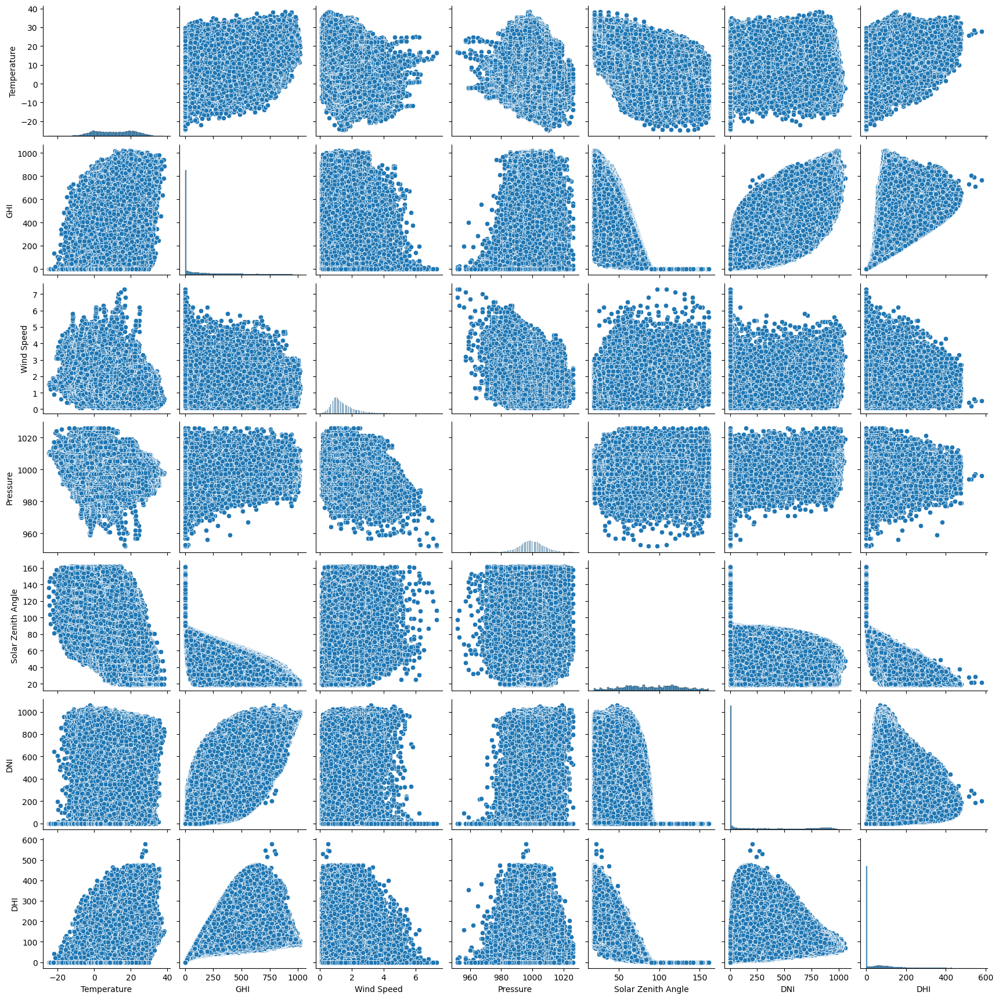

In [ ]:
# Pairplot of selected columns
cols = ['Temperature', 'GHI', 'Wind Speed', 'Pressure', 'Solar Zenith Angle', 'DNI', 'DHI']
sns.pairplot(millwood[cols])
plt.show()

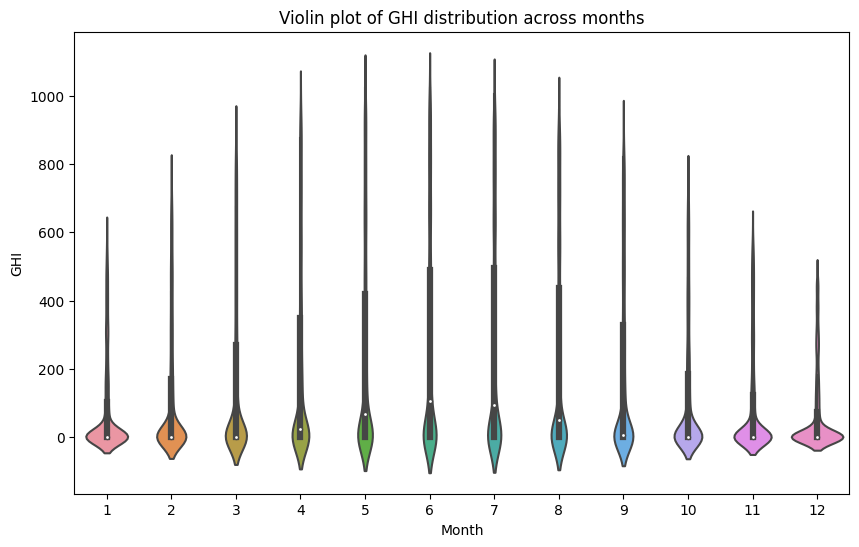

In [ ]:
# Violin plot of GHI distribution across different months
plt.figure(figsize=(10,6))
sns.violinplot(x="Month", y="GHI", data=millwood)
plt.title('Violin plot of GHI distribution across months')
plt.show()

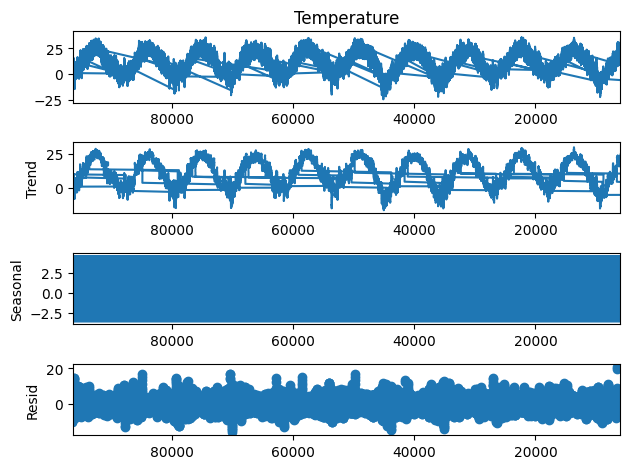

In [ ]:
# Time-series decomposition of Temperature
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(millwood['Temperature'], model='additive', period=24) # assuming hourly data
result.plot()
plt.show()

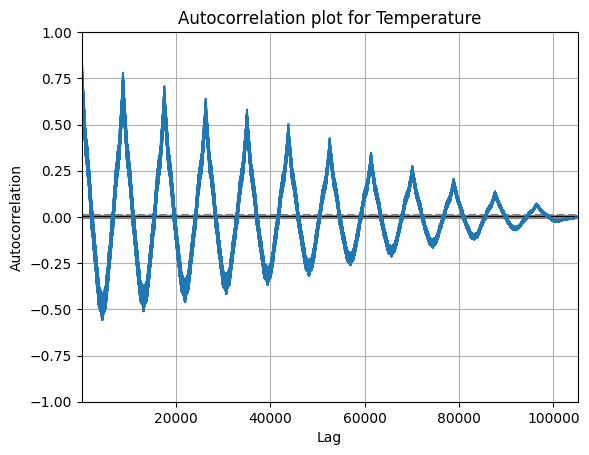

In [ ]:
from pandas.plotting import autocorrelation_plot

# Autocorrelation plot for Temperature
autocorrelation_plot(millwood['Temperature'])
plt.title('Autocorrelation plot for Temperature')
plt.show()

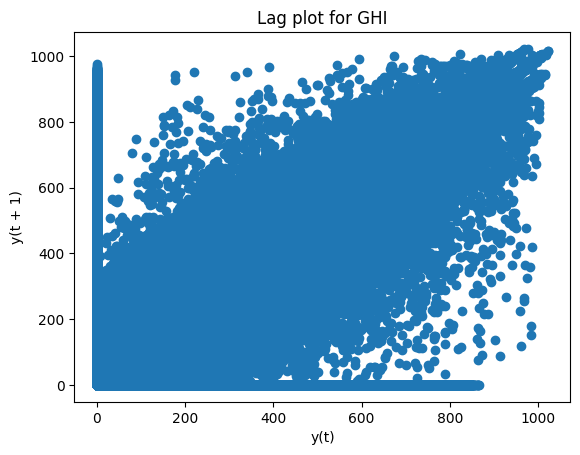

In [ ]:
from pandas.plotting import lag_plot

# Lag plot for GHI
lag_plot(millwood['GHI'])
plt.title('Lag plot for GHI')
plt.show()

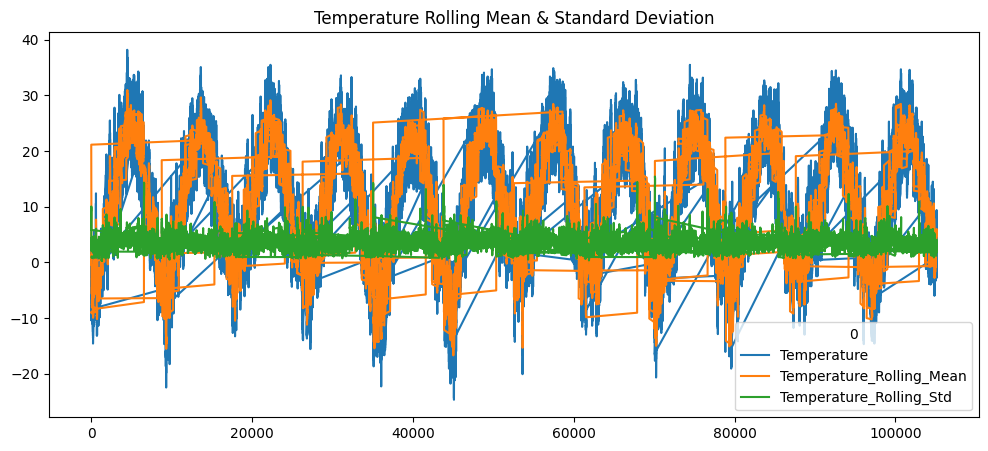

In [ ]:
# Rolling mean and standard deviation
millwood['Temperature_Rolling_Mean'] = millwood['Temperature'].rolling(window=24).mean()
millwood['Temperature_Rolling_Std'] = millwood['Temperature'].rolling(window=24).std()

# Plot original Temperature, rolling mean and standard deviation
millwood[['Temperature', 'Temperature_Rolling_Mean', 'Temperature_Rolling_Std']].plot(figsize=(12,5))
plt.title('Temperature Rolling Mean & Standard Deviation')
plt.show()

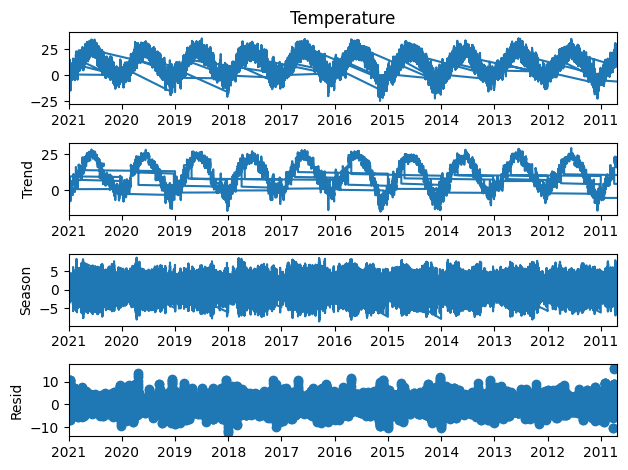

In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import STL

# Make a copy of the original dataframe
millwood_copy = millwood.copy()

# Create a datetime index in the copied dataframe
millwood_copy['Datetime'] = pd.to_datetime(millwood_copy[['Year', 'Month', 'Day', 'Hour']])
millwood_copy = millwood_copy.set_index('Datetime')

# Perform STL decomposition on Temperature
stl = STL(millwood_copy['Temperature'], period=24) # specify the period manually if it's not inferred correctly
result = stl.fit()

# Plot the decomposed components
result.plot()
plt.show()

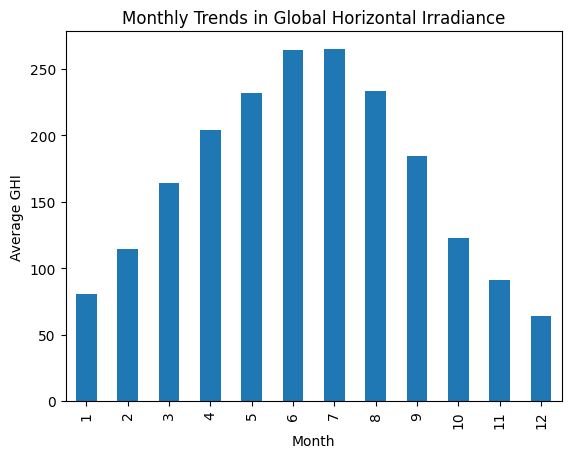

In [ ]:
millwood.groupby('Month')['GHI'].mean().plot(kind='bar')
plt.ylabel('Average GHI')
plt.title('Monthly Trends in Global Horizontal Irradiance')
plt.show()

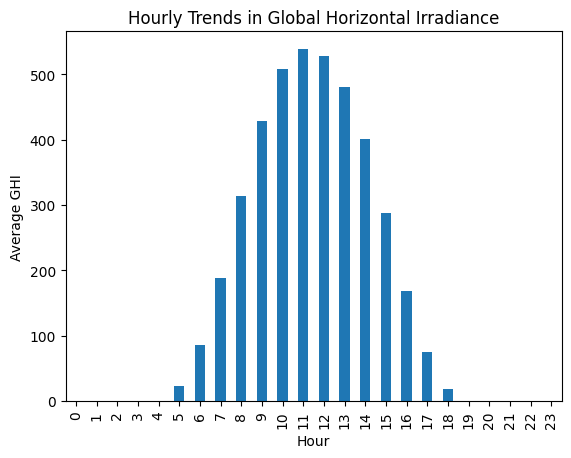

In [ ]:
millwood.groupby('Hour')['GHI'].mean().plot(kind='bar')
plt.ylabel('Average GHI')
plt.title('Hourly Trends in Global Horizontal Irradiance')
plt.show()

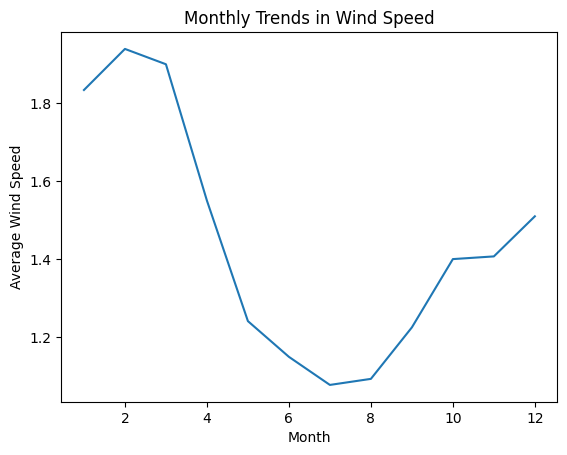

In [ ]:
millwood.groupby('Month')['Wind Speed'].mean().plot(kind='line')
plt.ylabel('Average Wind Speed')
plt.title('Monthly Trends in Wind Speed')
plt.show()

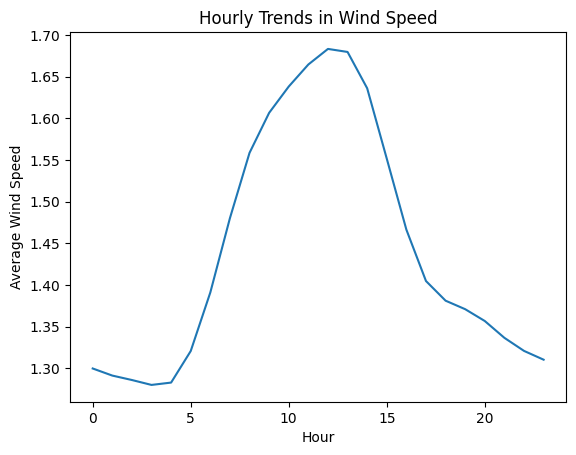

In [ ]:
millwood.groupby('Hour')['Wind Speed'].mean().plot(kind='line')
plt.ylabel('Average Wind Speed')
plt.title('Hourly Trends in Wind Speed')
plt.show()

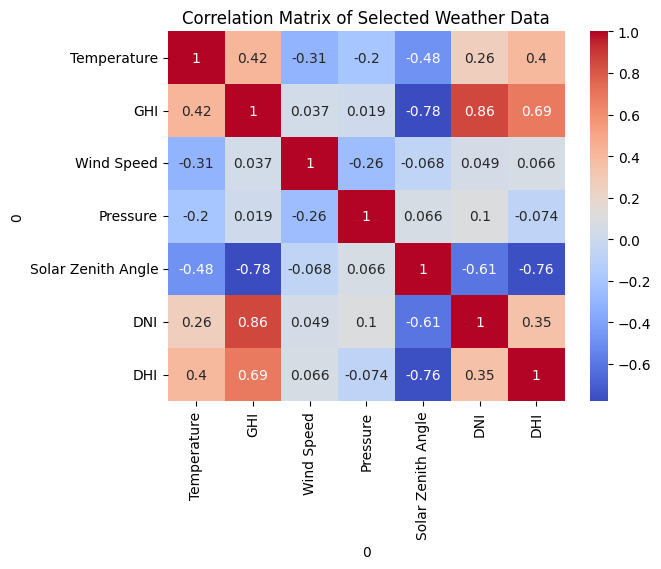

In [ ]:
cols = ['Temperature', 'GHI', 'Wind Speed', 'Pressure', 'Solar Zenith Angle', 'DNI', 'DHI']
corr_matrix = millwood[cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Selected Weather Data')
plt.show()

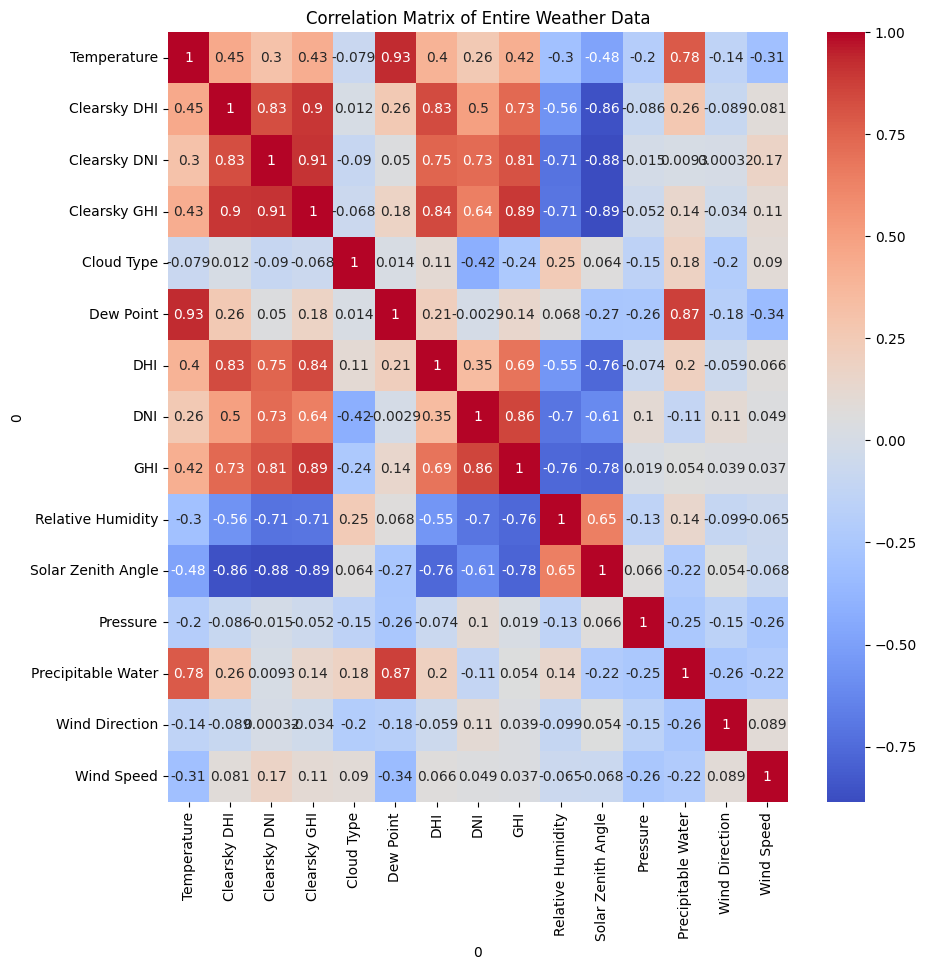

In [ ]:
# Select relevant columns
cols = ['Temperature', 'Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI', 'Cloud Type',
        'Dew Point', 'DHI', 'DNI', 'GHI', 'Relative Humidity', 'Solar Zenith Angle',
        'Pressure', 'Precipitable Water', 'Wind Direction', 'Wind Speed']

# Calculate correlation matrix
corr_matrix = millwood[cols].corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Entire Weather Data')
plt.show()

In [ ]:
df = millwood.groupby('Hour')['GHI'].mean().reset_index()
fig = px.line(df, x='Hour', y='GHI', title='Hourly Trends in Global Horizontal Irradiance')
fig.show()

In [ ]:
fig = px.scatter_3d(millwood, x='Temperature', y='GHI', z='Wind Speed')
fig.show()

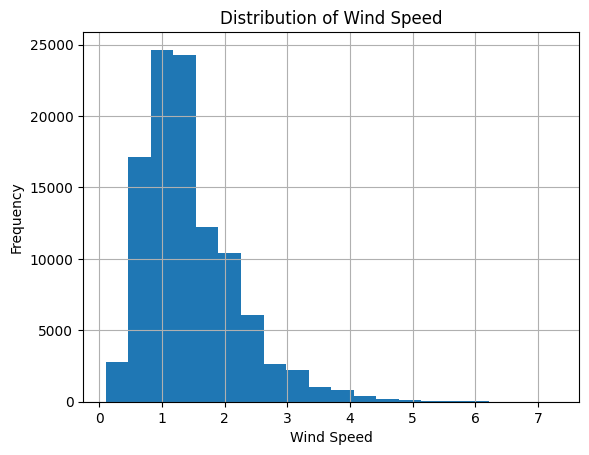

In [ ]:
millwood['Wind Speed'].hist(bins=20)
plt.title('Distribution of Wind Speed')
plt.xlabel('Wind Speed')
plt.ylabel('Frequency')
plt.show()

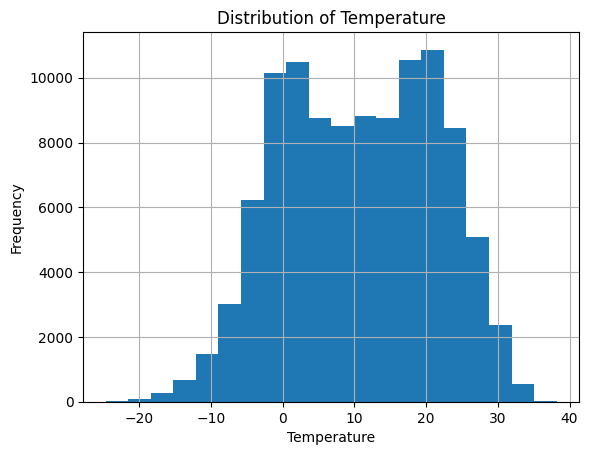

In [ ]:
millwood['Temperature'].hist(bins=20)
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.show()

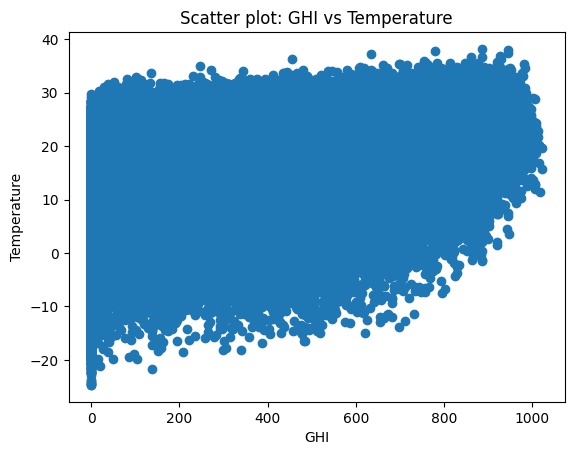

In [ ]:
plt.scatter(millwood['GHI'], millwood['Temperature'])
plt.xlabel('GHI')
plt.ylabel('Temperature')
plt.title('Scatter plot: GHI vs Temperature')
plt.show()

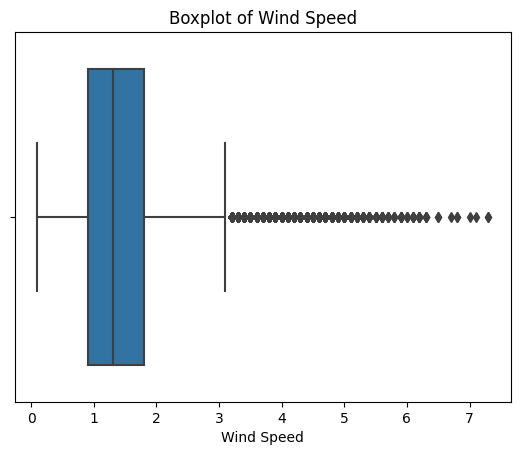

In [ ]:
sns.boxplot(x=millwood['Wind Speed'])
plt.title('Boxplot of Wind Speed')
plt.show()

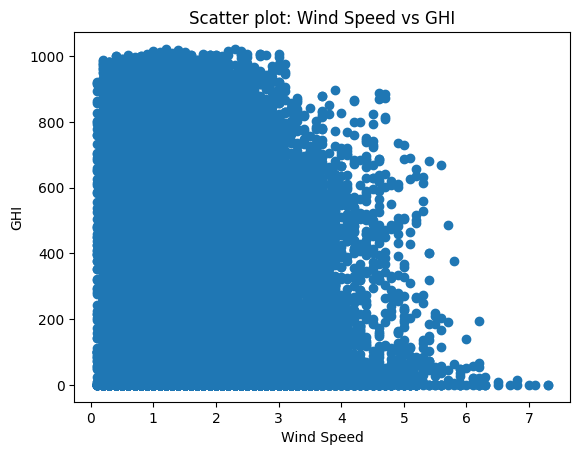

In [ ]:
plt.scatter(millwood['Wind Speed'], millwood['GHI'])
plt.xlabel('Wind Speed')
plt.ylabel('GHI')
plt.title('Scatter plot: Wind Speed vs GHI')
plt.show()

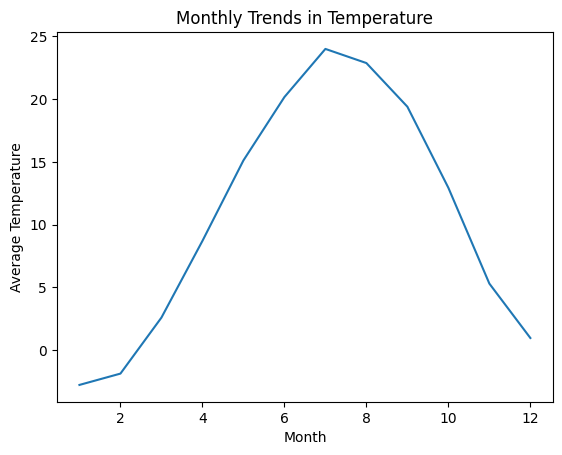

In [ ]:
millwood.groupby('Month')['Temperature'].mean().plot(kind='line')
plt.ylabel('Average Temperature')
plt.title('Monthly Trends in Temperature')
plt.show()

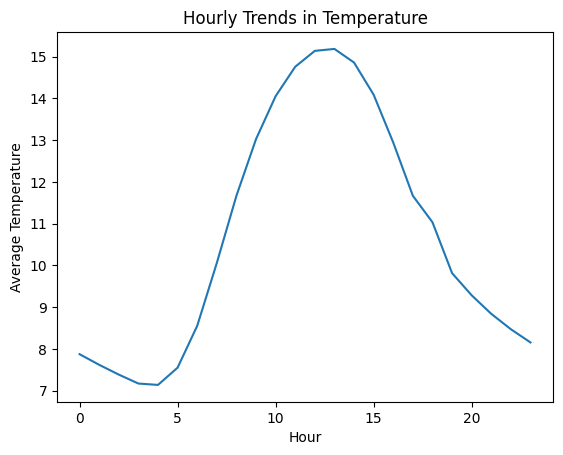

In [ ]:
millwood.groupby('Hour')['Temperature'].mean().plot(kind='line')
plt.ylabel('Average Temperature')
plt.title('Hourly Trends in Temperature')
plt.show()

##Tampa

####Location

In [ ]:
# Map for Tampa
m_tampa = folium.Map(location=[27.961, -82.345], zoom_start=16)

# Add a rectangle (bounding box) for Tampa
folium.Rectangle(
    bounds=[[27.959310, -82.346529], [27.962143, -82.343364]],
    color='#ff0000',
    fill=True,
    fill_color='#ff0000'
).add_to(m_tampa)

# Display the map
m_tampa

####Entire Weather Data Heatmap

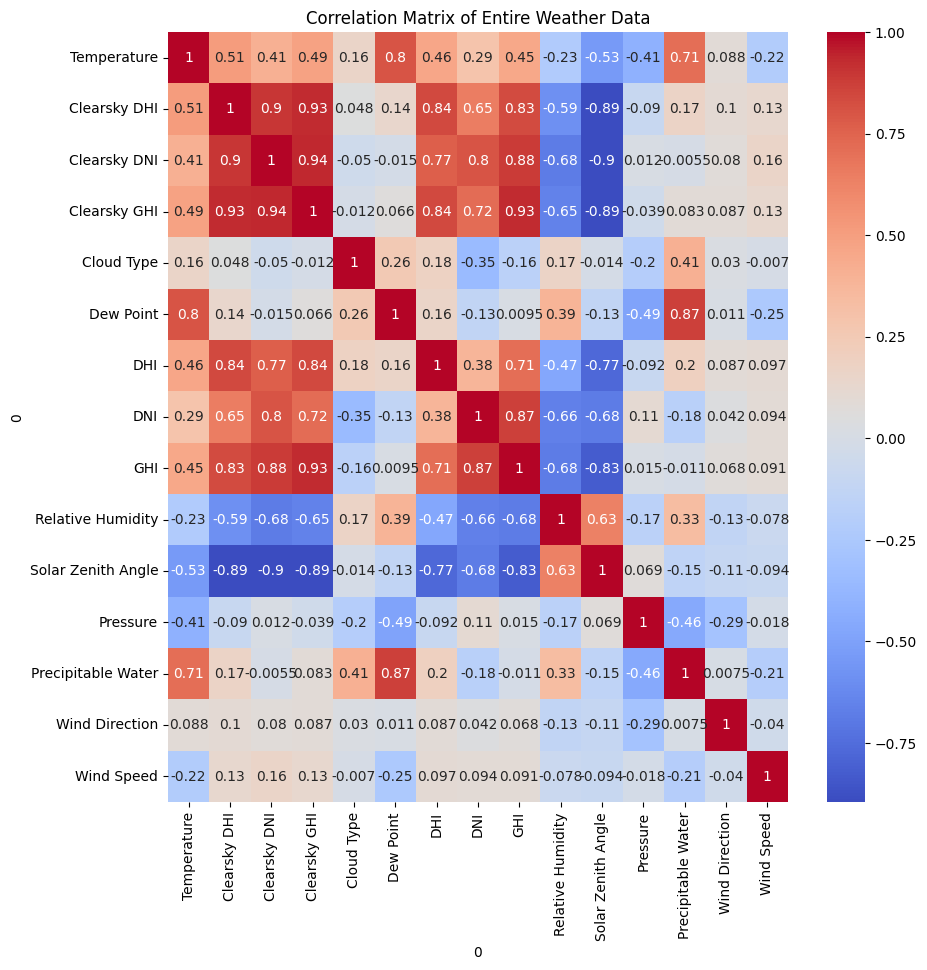

In [ ]:
# Select relevant columns
cols = ['Temperature', 'Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI', 'Cloud Type',
        'Dew Point', 'DHI', 'DNI', 'GHI', 'Relative Humidity', 'Solar Zenith Angle',
        'Pressure', 'Precipitable Water', 'Wind Direction', 'Wind Speed']

# Calculate correlation matrix
corr_matrix = tampa[cols].corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Entire Weather Data')
plt.show()

####Partial Weather Data Heatmap

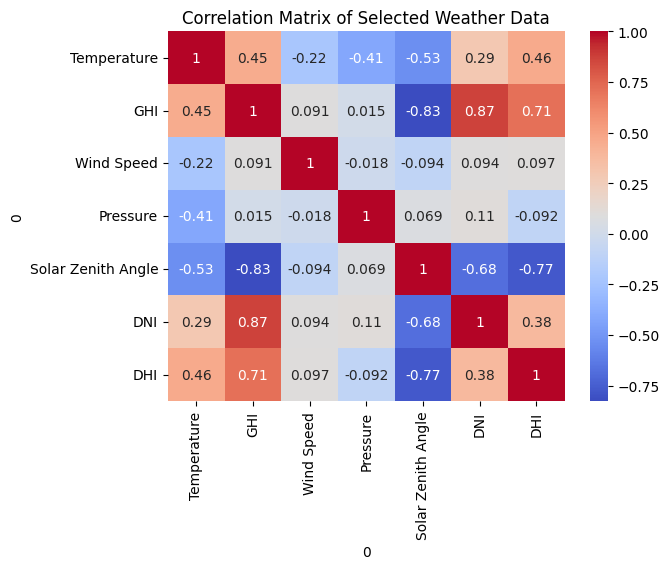

In [ ]:
cols = ['Temperature', 'GHI', 'Wind Speed', 'Pressure', 'Solar Zenith Angle', 'DNI', 'DHI']
corr_matrix = tampa[cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Selected Weather Data')
plt.show()

###Some Data Processing

In [ ]:
#Creating copy of Tampa
tampa_df = tampa.copy()

# Combine the Year, Month, Day, Hour, Minute columns into a single datetime column
tampa_df["Datetime"] = pd.to_datetime(tampa[["Year", "Month", "Day", "Hour", "Minute"]])

# Drop the original Year, Month, Day, Hour, Minute columns as they are no longer needed
tampa_df = tampa_df.drop(["Year", "Month", "Day", "Hour", "Minute"], axis=1)

# Reorder the columns to have "Datetime" at the start
cols = tampa_df.columns.tolist()
cols = cols[-1:] + cols[:-1]
tampa_df = tampa_df[cols]

# Show the first few rows of the updated dataframe
tampa_df.head()

,Datetime,Temperature,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,Dew Point,DHI,DNI,Fill Flag,GHI,Relative Humidity,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,Global Horizontal UV Irradiance (280-400nm),Global Horizontal UV Irradiance (295-385nm)
1,2021-01-01 00:30:00,19.4,0,0,0,7,19.4,0,0,0,0,99.71,174.98,0.17,1018,3.2,124,3.6,0.0000,0.0000
2,2021-01-01 01:30:00,19.3,0,0,0,0,19.3,0,0,0,0,100.00,166.21,0.17,1018,3.1,125,3.6,0.0000,0.0000
11,2021-01-01 10:30:00,24.5,87,813,507,0,20.3,87,813,0,507,77.66,58.91,0.17,1020,3.0,162,5.2,28.1262,21.9804
12,2021-01-01 11:30:00,25.4,91,862,608,0,20.3,91,862,0,608,73.37,53.11,0.17,1019,3.0,167,5.1,34.6958,27.1814
13,2021-01-01 12:30:00,26.0,92,879,646,0,20.2,92,879,0,646,70.41,50.89,0.17,1018,3.0,171,4.9,37.1954,29.1605


In [ ]:
# For the purpose of these visualizations, let's assume the "GHI" column represents solar radiation.

# Create a new dataframe with only the columns we're interested in
tampa_weather_df = tampa_df[["Datetime", "Temperature", "Wind Speed", "DNI"]]

# Set the Datetime column as the dataframe's index
tampa_weather_df = tampa_weather_df.set_index("Datetime")

# Create the monthly, yearly, and daily dataframes
tampa_weather_monthly = tampa_weather_df.resample("M").mean()
tampa_weather_yearly = tampa_weather_df.resample("Y").mean()
tampa_weather_daily = tampa_weather_df.resample("D").mean()

In [ ]:
# Reorder the columns to have "Datetime" at the start
cols = tampa_df.columns.tolist()
cols = cols[-1:] + cols[:-1]
tampa_df = tampa_df[cols]

# Create a new dataframe with only the columns we're interested in
tampa_weather_df = tampa_df[["Datetime", "Temperature", "Wind Speed", "DNI"]]

# Set the Datetime column as the dataframe's index
tampa_weather_df = tampa_weather_df.set_index("Datetime")

# Create the monthly, yearly, and daily dataframes
tampa_weather_monthly = tampa_weather_df.resample("M").mean()
tampa_weather_yearly = tampa_weather_df.resample("Y").mean()
tampa_weather_daily = tampa_weather_df.resample("D").mean()

###Official Chart 1 - Temp, Wind, GHI

####Hourly Average for Entire Data

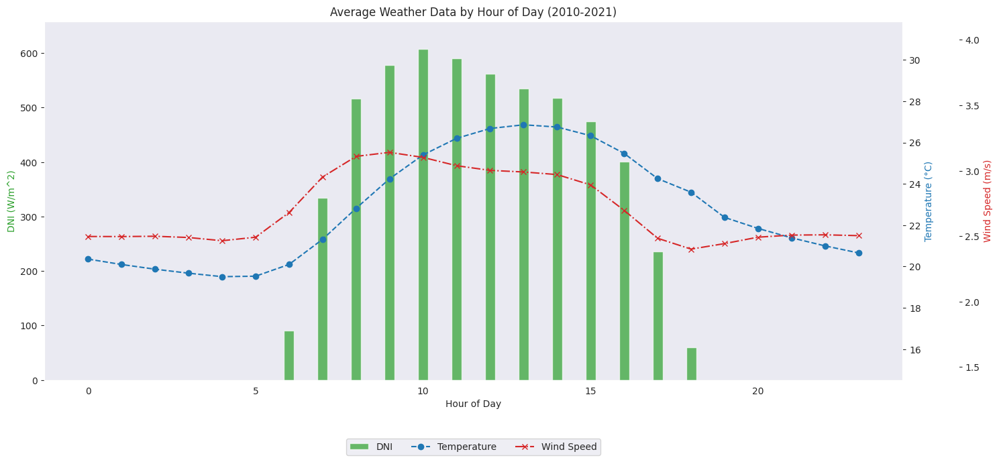

In [ ]:
# Create the hourly dataframe by resampling the original dataframe by 'H' for hourly frequency
tampa_weather_hourly = tampa_weather_df.resample("H").mean()

# Group the hourly dataframe by the hour of the day and take the mean
tampa_weather_hourly = tampa_weather_hourly.groupby(tampa_weather_hourly.index.hour).mean()

# Modify the plot for the hourly data to move the legend below the plot and adjust the y-axis for GHI
fig, ax = plt.subplots(figsize=(15, 7))

# Use seaborn style
sns.set_style("dark")

# Add the GHI bar plot with reduced width
ax.bar(tampa_weather_hourly.index, tampa_weather_hourly["DNI"], color='tab:green', alpha=0.7, label='DNI', width=0.3)

# Add the temperature line plot with a custom style
ax1 = ax.twinx()
ax1.plot(tampa_weather_hourly.index, tampa_weather_hourly["Temperature"], color='tab:blue', label='Temperature', linestyle='--', marker='o')

# Add the wind speed line plot with a custom style
ax2 = ax.twinx()
ax2.spines['right'].set_position(('outward', 60))
ax2.plot(tampa_weather_hourly.index, tampa_weather_hourly["Wind Speed"], color='tab:red', label='Wind Speed', linestyle='-.', marker='x')

# Set the title and labels
ax.set_title(f"Average Weather Data by Hour of Day (2010-2021)")
ax.set_xlabel('Hour of Day')
ax.set_ylabel('DNI (W/m^2)', color='tab:green')
ax1.set_ylabel('Temperature (°C)', color='tab:blue')
ax2.set_ylabel('Wind Speed (m/s)', color='tab:red')

# Adjust the y-axis for GHI to show more detail at the bottom
ax.set_ylim(bottom=0, top=tampa_weather_hourly["DNI"].max() + 50)
ax1.set_ylim(bottom=tampa_weather_hourly["Temperature"].min() - 5, top=tampa_weather_hourly["Temperature"].max() + 5)
ax2.set_ylim(bottom=tampa_weather_hourly["Wind Speed"].min() - 1, top=tampa_weather_hourly["Wind Speed"].max() + 1)

# Set the legend below the plot
handles, labels = ax.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax.legend(handles + handles1 + handles2, labels + labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()

####Monthly Average for Entire Data

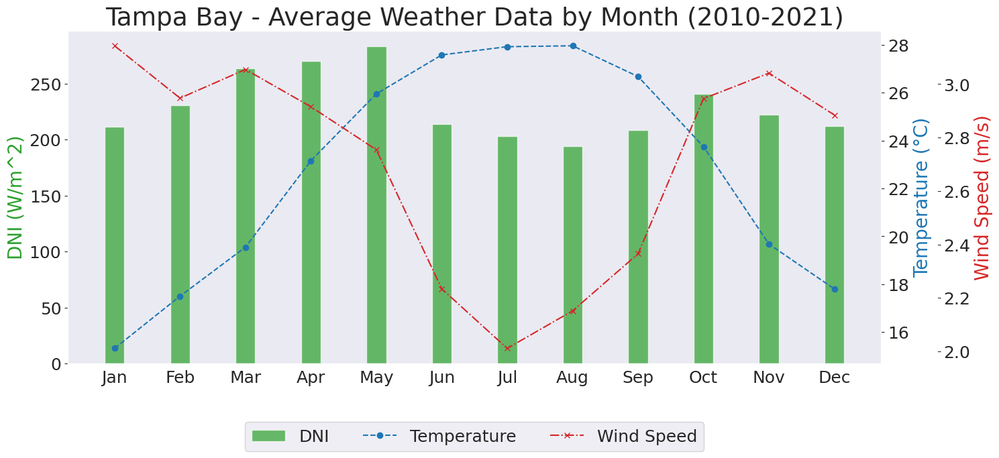

In [ ]:
import matplotlib.dates as mdates

# Calculate the average monthly data
tampa_weather_monthly_avg = tampa_weather_df.resample("M").mean()
tampa_weather_monthly_avg = tampa_weather_monthly_avg.groupby(tampa_weather_monthly_avg.index.month).mean()

# Plot the average monthly data
fig, ax = plt.subplots(figsize=(15, 7))
sns.set_style("dark")

ax.bar(tampa_weather_monthly_avg.index, tampa_weather_monthly_avg["DNI"], color='tab:green', alpha=0.7, label='DNI', width=0.3)

ax1 = ax.twinx()
ax1.plot(tampa_weather_monthly_avg.index, tampa_weather_monthly_avg["Temperature"], color='tab:blue', label='Temperature', linestyle='--', marker='o')

ax2 = ax.twinx()
ax2.spines['right'].set_position(('outward', 60))
ax2.plot(tampa_weather_monthly_avg.index, tampa_weather_monthly_avg["Wind Speed"], color='tab:red', label='Wind Speed', linestyle='-.', marker='x')

# Make title, axis numbers and labels bigger
ax.set_title(f"Tampa Bay - Average Weather Data by Month (2010-2021)", fontsize=27)
ax.tick_params(axis='both', which='major', labelsize=18)
ax.set_ylabel('DNI (W/m^2)', color='tab:green', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=18)
ax1.set_ylabel('Temperature (°C)', color='tab:blue', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=18)
ax2.set_ylabel('Wind Speed (m/s)', color='tab:red', fontsize=20)

# Remove x-axis title
ax.set_xlabel('')

# Set x-axis as month names
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax.set_xticks(range(1, 13))
ax.set_xticklabels(month_names, fontsize=18)

handles, labels = ax.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax.legend(handles + handles1 + handles2, labels + labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3, fontsize=18)

plt.tight_layout()
plt.show()

####Yearly Average of Entire Data

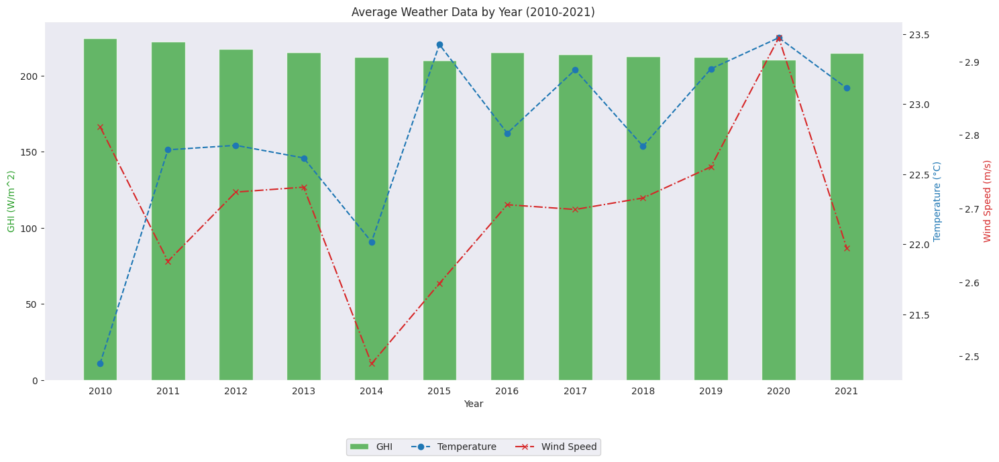

In [ ]:
# Calculate the average annual data
tampa_weather_annual_avg = tampa_weather_df.resample("Y").mean()

# Plot the average annual data
fig, ax = plt.subplots(figsize=(15, 7))
sns.set_style("dark")

# Add bar plot for GHI
ax.bar(tampa_weather_annual_avg.index.year, tampa_weather_annual_avg["GHI"], color='tab:green', alpha=0.7, label='GHI', width=0.5)

# Add line plot for Temperature
ax1 = ax.twinx()
ax1.plot(tampa_weather_annual_avg.index.year, tampa_weather_annual_avg["Temperature"], color='tab:blue', label='Temperature', linestyle='--', marker='o')

# Add line plot for Wind Speed
ax2 = ax.twinx()
ax2.spines['right'].set_position(('outward', 60))
ax2.plot(tampa_weather_annual_avg.index.year, tampa_weather_annual_avg["Wind Speed"], color='tab:red', label='Wind Speed', linestyle='-.', marker='x')

# Set the title and labels
ax.set_title(f"Average Weather Data by Year (2010-2021)")
ax.set_xlabel('Year')
ax.set_ylabel('GHI (W/m^2)', color='tab:green')
ax1.set_ylabel('Temperature (°C)', color='tab:blue')
ax2.set_ylabel('Wind Speed (m/s)', color='tab:red')

# Set the x-ticks to show every year
plt.xticks(tampa_weather_annual_avg.index.year)

# Set the legend
handles, labels = ax.get_legend_handles_labels()
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax.legend(handles + handles1 + handles2, labels + labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

plt.tight_layout()
plt.show()

###Official Chart 2 - Flows vs. kWh

####Coorelation Coefficient

In [ ]:
# Calculate the correlation for all data points
all_data_corr = tampa_flow_energy['Daily_Kwh'].corr(tampa_flow_energy['Treated_Water_MG'])

# Calculate the correlation for data points where none of the columns are 0
non_zero_data = tampa_flow_energy[(tampa_flow_energy['Daily_Kwh'] != 0) & (tampa_flow_energy['Treated_Water_MG'] != 0)]
non_zero_data_corr = non_zero_data['Daily_Kwh'].corr(non_zero_data['Treated_Water_MG'])

all_data_corr, non_zero_data_corr

(0.9684563637793853, 0.7620993218403714)

The correlation coefficient between 'Daily_Kwh' and 'Treated_Water_MG' for all data points is approximately 0.97, which indicates a strong positive correlation. However, when considering only data points where none of the columns are zero, the correlation coefficient drops to about 0.76. This is still a moderate positive correlation, but significantly less than when including zero values.

This Pearson coorelation coefficient measures the strength and direction of the linear relationship between two variables. The values range between -1.0 and 1.0. A calculated number greater than 1.0 or less than -1.0 means that there were errors in the correlation measurement. A correlation of -1.0 shows a perfect negative correlation, while a correlation of 1.0 shows a perfect positive correlation. A correlation of 0.0 shows no linear relationship between the movement of the two variables.

####Entire Period

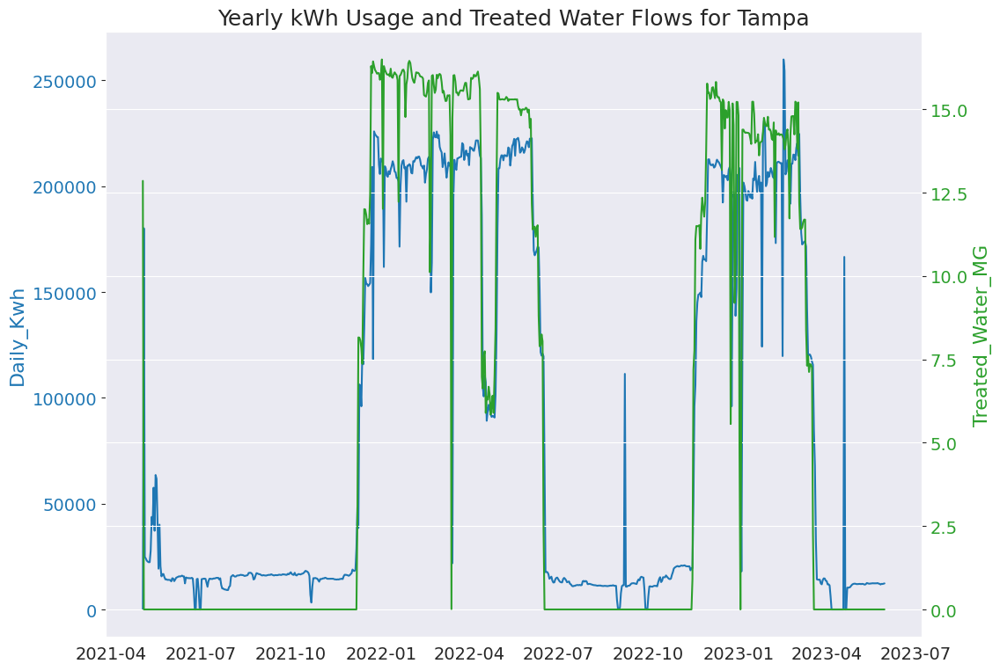

In [ ]:
# Entire time period with dual y-axis
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:blue'
ax1.set_ylabel('Daily_Kwh', color=color, fontsize=16)
ax1.plot(tampa_flow_energy['Date'], tampa_flow_energy['Daily_Kwh'], color=color)
ax1.tick_params(axis='y', labelcolor=color, labelsize=14)
ax1.tick_params(axis='x', labelsize=14)

ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Treated_Water_MG', color=color, fontsize=16)
ax2.plot(tampa_flow_energy['Date'], tampa_flow_energy['Treated_Water_MG'], color=color)
ax2.tick_params(axis='y', labelcolor=color, labelsize=14)

fig.tight_layout(pad=3.0)  # Increase padding to avoid title being cut off
plt.title('Yearly kWh Usage and Treated Water Flows for Tampa', fontsize=18)
plt.grid(True)
plt.show()

In [ ]:
#Finding peaks of kWh when Water Flows is 0
tampa_flow_energy[(tampa_flow_energy['Daily_Kwh'] > 100000) & (tampa_flow_energy['Treated_Water_MG'] == 0)]

,Daily_Kwh,Treated_Water_MG,Date
1,180112.0,0.0,2021-05-04
492,111312.0,0.0,2022-09-07
716,166576.0,0.0,2023-04-19


This chart was also helpful for finding outliers or discrepancies in data. These were addressed by taking the weighted average of the corresponding column as the two columns have a strong correlation - a fair method to fill in data points. This was likely a result of data, not being logged on specific day. For example, two days of logging to total energy consumption might have been skipped however, the energy consumption from those two days were added to the next day so it would be fair to divide those accordingly.

####Monthly Average of Entire Data

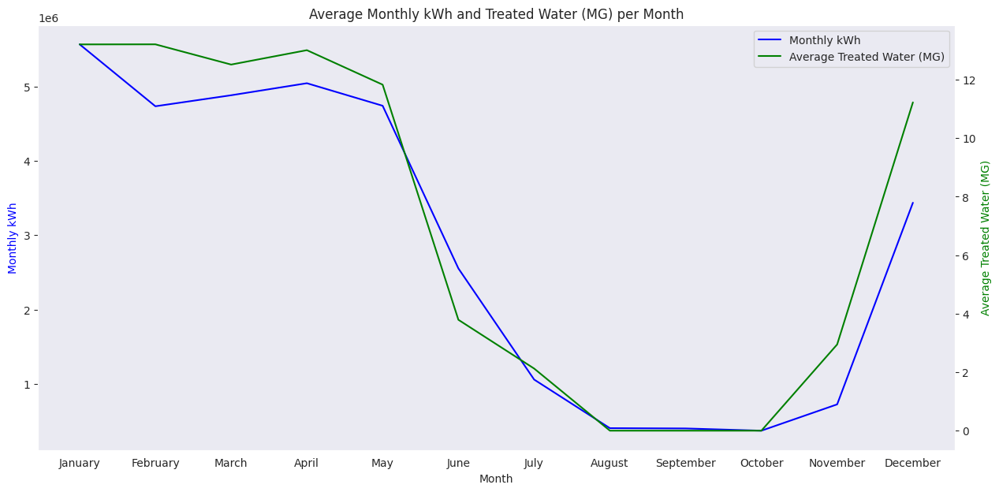

In [ ]:
# Set the 'Date' column as the index of the dataframe
tampa_monthly_energy_flows = tampa_monthly_energy_flows.set_index('Date')

# Group by each month and take the average
monthly_avg = tampa_monthly_energy_flows.groupby(tampa_monthly_energy_flows.index.month).mean()

fig, ax = plt.subplots(figsize=(15, 7))
ax.plot(monthly_avg.index, monthly_avg['Monthly kWh'], color='blue', label='Monthly kWh')
ax2 = ax.twinx()
ax2.plot(monthly_avg.index, monthly_avg['Average Treated Water (MG)'], color='green', label='Average Treated Water (MG)')

ax.set_title('Average Monthly kWh and Treated Water (MG) per Month')
ax.set_xlabel('Month')
ax.set_ylabel('Monthly kWh', color='blue')
ax2.set_ylabel('Average Treated Water (MG)', color='green')

# Set x-ticks to month names
ax.set_xticks(range(1, 13))
ax.set_xticklabels([calendar.month_name[i] for i in range(1, 13)])

handles, labels = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax.legend(handles + handles2, labels + labels2)

plt.show()

####Yearly Average of Entire Data

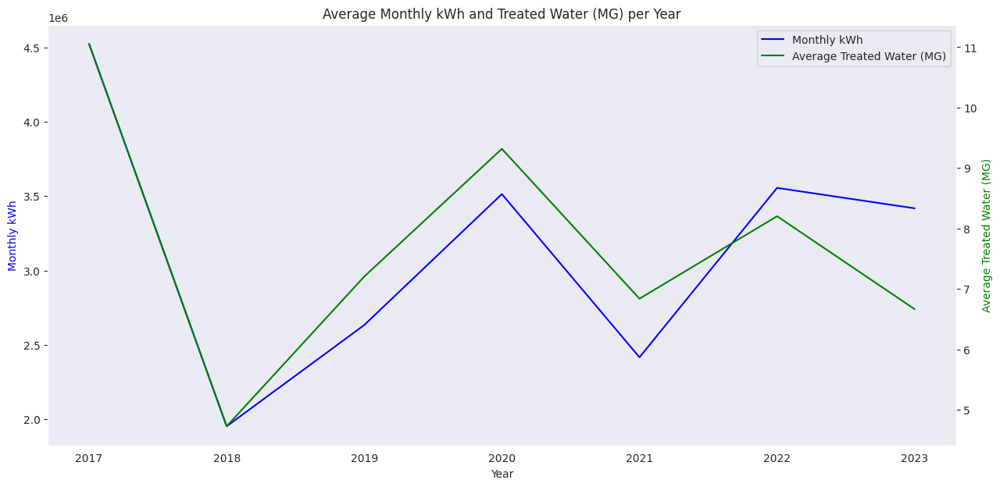

In [ ]:
# Group by each year and take the average
yearly_avg = tampa_monthly_energy_flows.groupby(tampa_monthly_energy_flows.index.year).mean()

fig, ax = plt.subplots(figsize=(15, 7))
ax.plot(yearly_avg.index, yearly_avg['Monthly kWh'], color='blue', label='Monthly kWh')
ax2 = ax.twinx()
ax2.plot(yearly_avg.index, yearly_avg['Average Treated Water (MG)'], color='green', label='Average Treated Water (MG)')

ax.set_title('Average Monthly kWh and Treated Water (MG) per Year')
ax.set_xlabel('Year')
ax.set_ylabel('Monthly kWh', color='blue')
ax2.set_ylabel('Average Treated Water (MG)', color='green')

# Set x-ticks directly to the years
ax.set_xticks(yearly_avg.index)

handles, labels = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax.legend(handles + handles2, labels + labels2)

plt.show()

###Official Chart 3 - SEC (kWh/m<sup>3</sup>)

####Daily over Entire Period

In [ ]:
#Show Rows Where SEC > 7
tampa_energy_quality[tampa_energy_quality['SEC (kWh/m3)'] > 7]

,Date,Daily - kWh,"TotalTreated water leaving plant,MG","TotalTreated water leaving plant, m3",SEC (kWh/m3),"Total Raw water to plant,MG",% Raw Water / Treated Water,Hours Plant in Operation,"Average Daily Turbidity,NTU (Treated)",Temp,pH,"Maximum Raw,NTll","Maximum Settled,.NTU",Max. Filtered Turbidity,Raw TDS
315,2022-03-14,21840.0,0.01074,40.651022,537.255866,11.4844,0.000935,2.0,0.0614,24.70,7.98,1.553333,2.340000,0.061667,NaN
346,2022-04-14,186224.0,6.97168,26387.887960,7.057177,12.3594,0.564079,2.0,0.0530,24.80,7.80,4.196667,1.761667,0.050000,NaN
409,2022-06-16,119584.0,2.39551,9067.032551,13.188880,12.1738,0.196776,7.5,0.0542,30.00,7.60,5.155000,2.835000,0.050000,NaN
600,2022-12-24,205264.0,5.56445,21061.506430,9.745932,15.8574,0.350906,24.0,0.0680,24.70,7.95,4.385000,3.070000,0.066667,NaN
609,2023-01-02,208528.0,4.86719,18422.369420,11.319282,14.8359,0.328068,8.0,0.0628,23.35,7.81,0.790000,2.410000,0.060000,NaN
684,2023-03-18,115616.0,2.29688,8693.716881,13.298800,12.9082,0.177940,7.0,0.0592,29.70,7.63,2.526667,2.811667,0.060000,NaN


In [ ]:
# Remove rows where 'SEC (kWh/m3)' is greater than 500
tampa_energy_quality = tampa_energy_quality[tampa_energy_quality['SEC (kWh/m3)'] <= 500]

tampa_energy_quality.head()

,Date,Daily - kWh,"TotalTreated water leaving plant,MG","TotalTreated water leaving plant, m3",SEC (kWh/m3),"Total Raw water to plant,MG",% Raw Water / Treated Water,Hours Plant in Operation,"Average Daily Turbidity,NTU (Treated)",Temp,pH,"Maximum Raw,NTll","Maximum Settled,.NTU",Max. Filtered Turbidity,Raw TDS
219,2021-12-08,48016.0,2.76758,10475.32173,4.583726,11.603238,0.238518,0.0,0.0411,20.8,7.53,0.843333,2.333333,0.040000,NaN
220,2021-12-09,38496.0,8.16211,30893.67903,1.246080,13.898524,0.587265,0.0,0.0696,19.5,7.57,0.838333,1.741667,0.070000,NaN
221,2021-12-10,106320.0,8.15332,30860.40878,3.445191,13.648112,0.597395,0.0,0.0711,18.8,7.56,0.785000,2.083333,0.071667,NaN
222,2021-12-11,105424.0,8.06738,30535.12491,3.452549,12.839174,0.628341,0.0,0.0703,19.3,7.64,0.905000,1.640000,0.070000,NaN
223,2021-12-12,96000.0,7.84180,29681.30204,3.234359,15.866499,0.494236,0.0,0.0688,19.7,7.57,0.816667,1.736667,0.070000,NaN


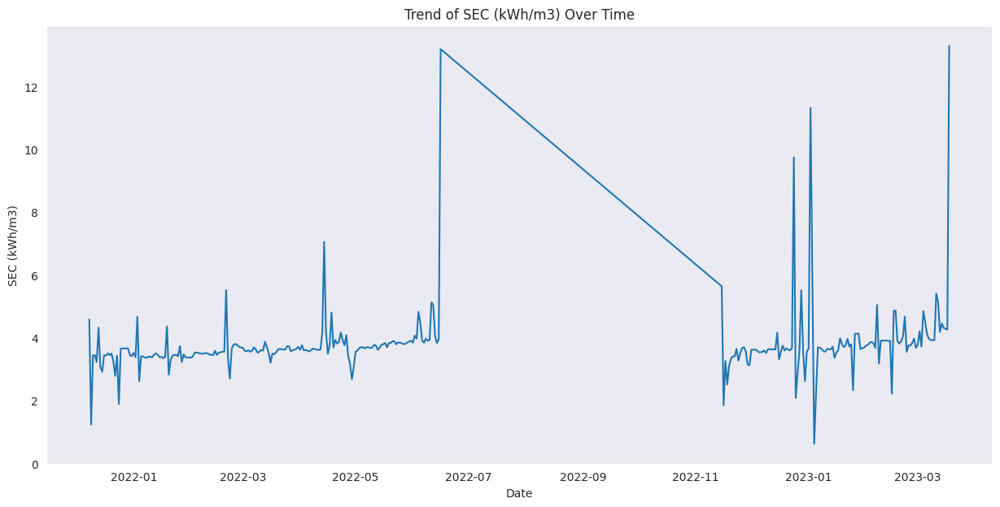

In [ ]:
# Set 'Date' as the index
tampa_energy_quality.set_index('Date', inplace=True)

# Plot 'SEC (kWh/m3)' against 'Date'
plt.figure(figsize=(15,7))
plt.plot(tampa_energy_quality.index, tampa_energy_quality['SEC (kWh/m3)'])
plt.title('Trend of SEC (kWh/m3) Over Time')
plt.xlabel('Date')
plt.ylabel('SEC (kWh/m3)')
plt.show()

####Monthly with Treated Water over Entire Period

In [ ]:
# Conversion factor from MG to m^3
MG_TO_M3 = 3785.41

# Convert 'Average Treated Water (MG)' to m^3
tampa_monthly_energy_flows['Average Treated Water (m^3)'] = tampa_monthly_energy_flows['Average Treated Water (MG)'] * MG_TO_M3

# Calculate SEC
tampa_monthly_energy_flows['SEC'] = tampa_monthly_energy_flows['Monthly kWh'] / tampa_monthly_energy_flows['Average Treated Water (m^3)']

tampa_monthly_energy_flows.head()

,Average Treated Water (MG),Monthly kWh,Average Treated Water (m^3),SEC
Date,,,,
2017-01-01,15.594667,6321200,59032.207147,107.080530
2017-02-01,16.208214,6513200,61354.736439,106.156434
2017-03-01,14.559032,5718500,55111.906300,103.761608
2017-04-01,14.699000,5784225,55641.741590,103.954780
2017-05-01,12.943000,6256275,48994.561630,127.693254


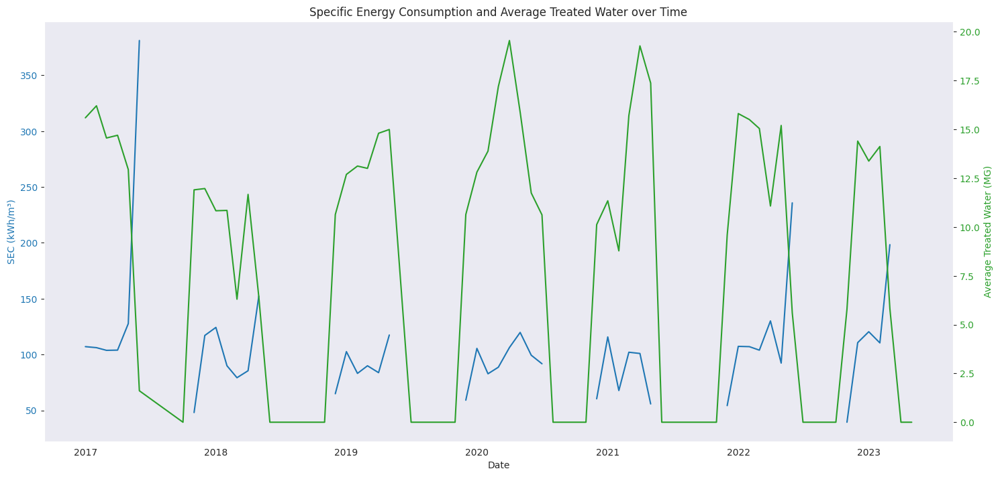

In [ ]:
fig, ax1 = plt.subplots(figsize=(15, 7))

color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('SEC (kWh/m³)', color=color)
ax1.plot(tampa_monthly_energy_flows.index, tampa_monthly_energy_flows['SEC'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Average Treated Water (MG)', color=color)
ax2.plot(tampa_monthly_energy_flows.index, tampa_monthly_energy_flows['Average Treated Water (MG)'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Specific Energy Consumption and Average Treated Water over Time')
plt.show()

###Official Chart 4 - Energy Quality Heatmap

In [ ]:
# Calculate correlation coefficients
corr_sec_temp = tampa_energy_quality['SEC (kWh/m3)'].corr(tampa_energy_quality['Temp'])
corr_sec_maxraw = tampa_energy_quality['SEC (kWh/m3)'].corr(tampa_energy_quality['Maximum Raw,NTll'])

# Print correlation coefficients
print(f"Correlation between 'SEC (kWh/m3)' and 'Temp': {corr_sec_temp}")
print(f"Correlation between 'SEC (kWh/m3)' and 'Maximum Raw,NTll': {corr_sec_maxraw}")

Correlation between 'SEC (kWh/m3)' and 'Temp': 0.18017925759130127
Correlation between 'SEC (kWh/m3)' and 'Maximum Raw,NTll': 0.03655826406131243


The correlation between 'SEC (kWh/m3)' and 'Temp' is approximately -0.0035, and the correlation between 'SEC (kWh/m3)' and 'Maximum Raw,NTll' is approximately -0.0396.

Both correlation coefficients are very close to 0, indicating that there's essentially no linear relationship between 'SEC (kWh/m3)' and either 'Temp' or 'Maximum Raw,NTll'. It's important to note that this doesn't necessarily mean that there's no relationship at all between these variables, just that any relationship is not linear. Other types of relationships might exist that aren't captured by the correlation coefficient.

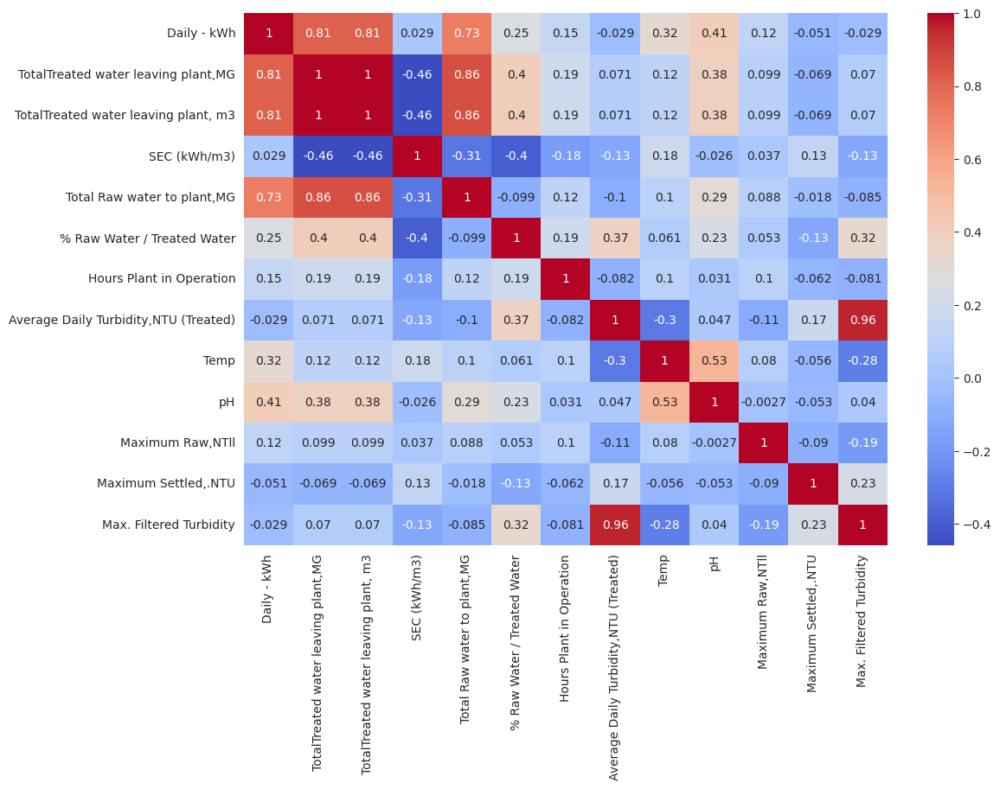

In [ ]:
# Create a new figure with a specified size (in inches)
plt.figure(figsize=(12, 8))

# Calculate correlation matrix for all numeric variables only, excluding 'Raw TDS' column
correlation_matrix = tampa_energy_quality.drop(columns=['Raw TDS']).corr()

# Generate a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Display the heatmap
plt.show()


##Almeda

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
# Skewness of numerical columns
numerical_columns = ['Temperature', 'GHI', 'Wind Speed', 'Pressure', 'Solar Zenith Angle', 'DNI', 'DHI']
print("Skewness:")
print(almeda[numerical_columns].skew())
print("\nKurtosis:")
print(almeda[numerical_columns].kurtosis())

Skewness:
0
Temperature           0.812699
GHI                   1.193800
Wind Speed            0.737142
Pressure             -0.043551
Solar Zenith Angle    0.000498
DNI                   0.806631
DHI                   1.914959
dtype: float64

Kurtosis:
0
Temperature           0.519076
GHI                   0.063593
Wind Speed            0.096130
Pressure              1.652169
Solar Zenith Angle   -0.957160
DNI                  -1.090556
DHI                   4.307314
dtype: float64


In [ ]:
import folium

# Map for Alameda
m_alameda = folium.Map(location=[37.505326, -121.961017], zoom_start=16)

# Add a rectangle (bounding box) for Alameda
folium.Rectangle(
    bounds=[[37.504247, -121.961805], [37.506007, -121.960686]],
    color='#ff0000',
    fill=True,
    fill_color='#ff0000'
).add_to(m_alameda)

# Display the map
m_alameda

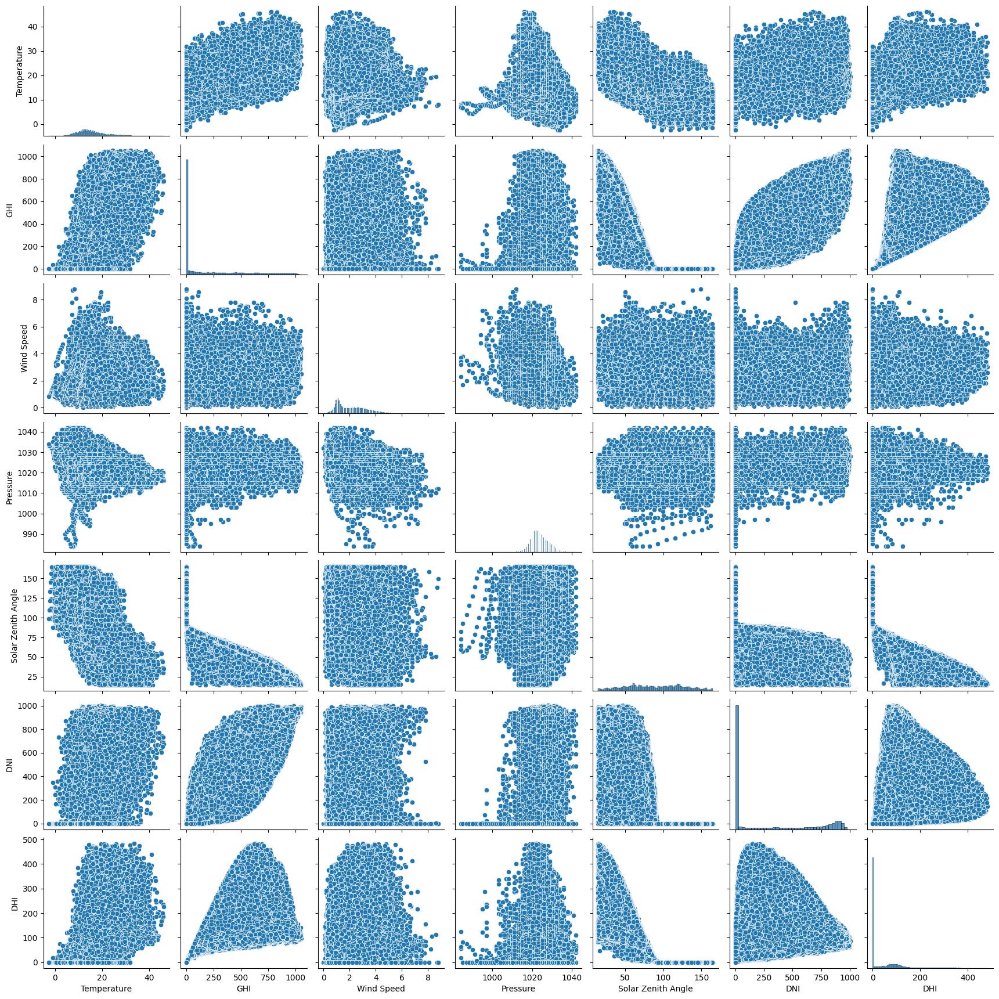

In [ ]:
# Pairplot of selected columns
cols = ['Temperature', 'GHI', 'Wind Speed', 'Pressure', 'Solar Zenith Angle', 'DNI', 'DHI']
sns.pairplot(almeda[cols])
plt.show()

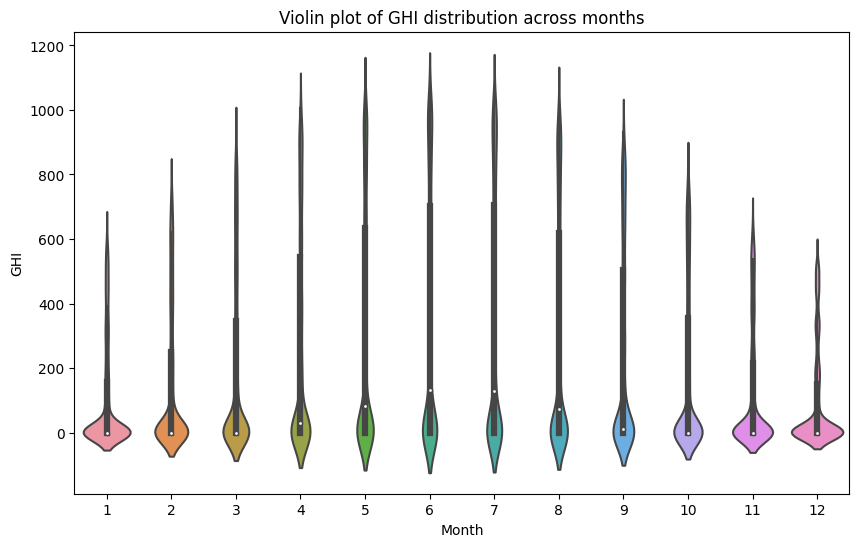

In [ ]:
# Violin plot of GHI distribution across different months
plt.figure(figsize=(10,6))
sns.violinplot(x="Month", y="GHI", data=almeda)
plt.title('Violin plot of GHI distribution across months')
plt.show()

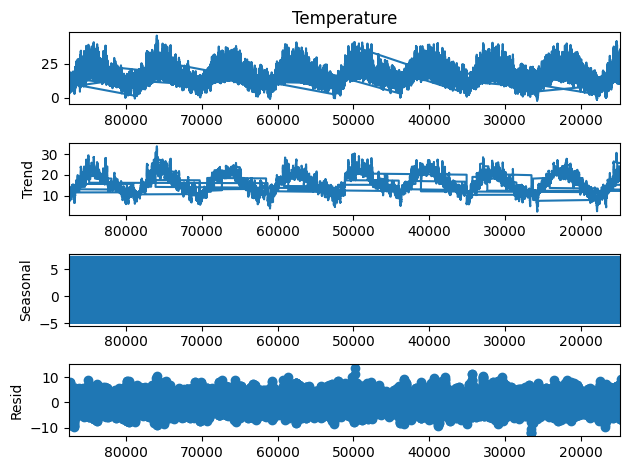

In [ ]:
# Time-series decomposition of Temperature
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(almeda['Temperature'], model='additive', period=24) # assuming hourly data
result.plot()
plt.show()

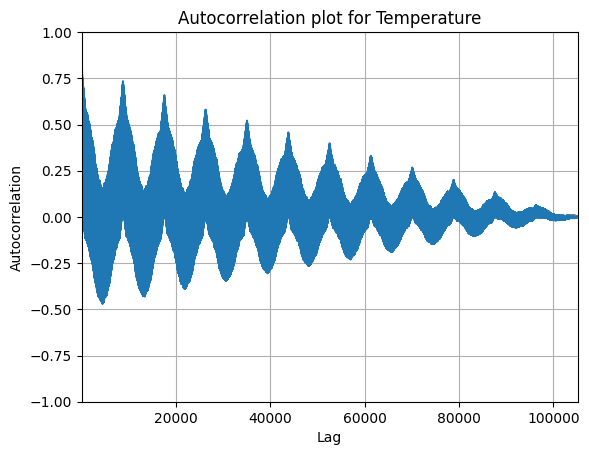

In [ ]:
from pandas.plotting import autocorrelation_plot

# Autocorrelation plot for Temperature
autocorrelation_plot(almeda['Temperature'])
plt.title('Autocorrelation plot for Temperature')
plt.show()

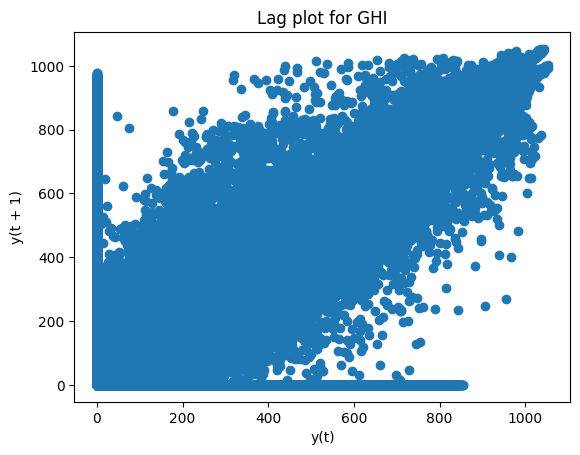

In [ ]:
from pandas.plotting import lag_plot

# Lag plot for GHI
lag_plot(almeda['GHI'])
plt.title('Lag plot for GHI')
plt.show()

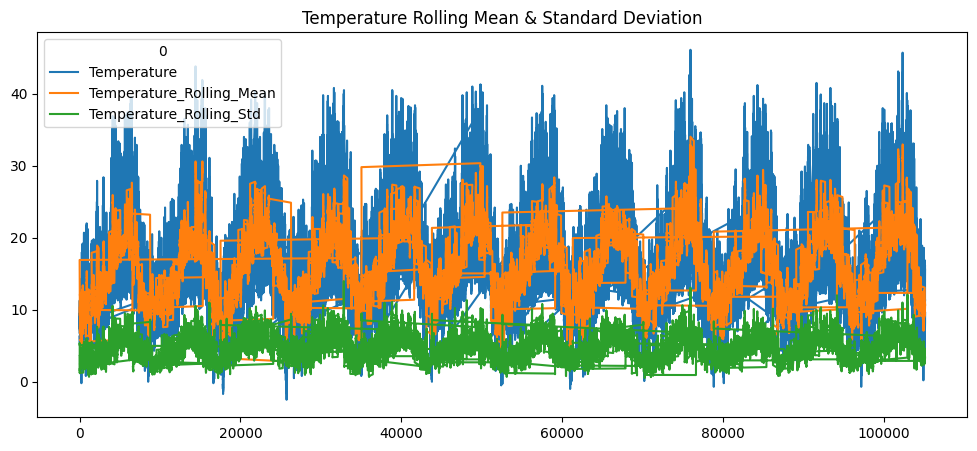

In [ ]:
# Rolling mean and standard deviation
almeda['Temperature_Rolling_Mean'] = almeda['Temperature'].rolling(window=24).mean()
almeda['Temperature_Rolling_Std'] = almeda['Temperature'].rolling(window=24).std()

# Plot original Temperature, rolling mean and standard deviation
almeda[['Temperature', 'Temperature_Rolling_Mean', 'Temperature_Rolling_Std']].plot(figsize=(12,5))
plt.title('Temperature Rolling Mean & Standard Deviation')
plt.show()

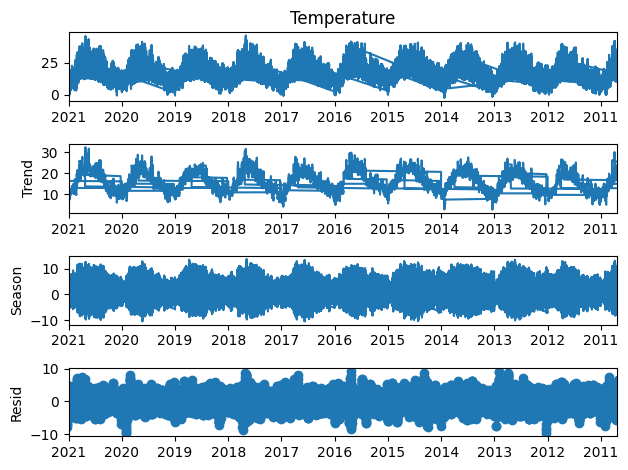

In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import STL

# Make a copy of the original dataframe
almeda_copy = almeda.copy()

# Create a datetime index in the copied dataframe
almeda_copy['Datetime'] = pd.to_datetime(almeda_copy[['Year', 'Month', 'Day', 'Hour']])
almeda_copy = almeda_copy.set_index('Datetime')

# Perform STL decomposition on Temperature
stl = STL(almeda_copy['Temperature'], period=24) # specify the period manually if it's not inferred correctly
result = stl.fit()

# Plot the decomposed components
result.plot()
plt.show()

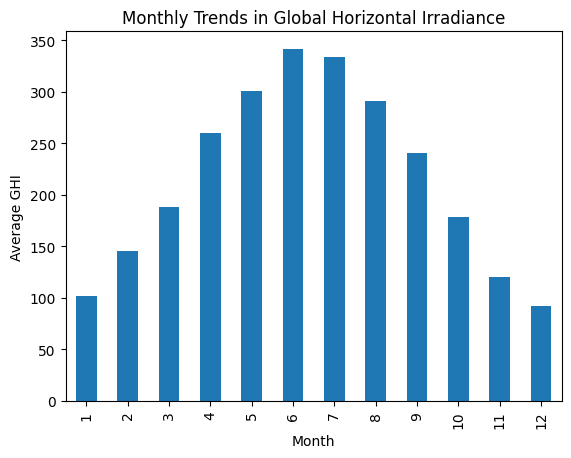

In [ ]:
almeda.groupby('Month')['GHI'].mean().plot(kind='bar')
plt.ylabel('Average GHI')
plt.title('Monthly Trends in Global Horizontal Irradiance')
plt.show()

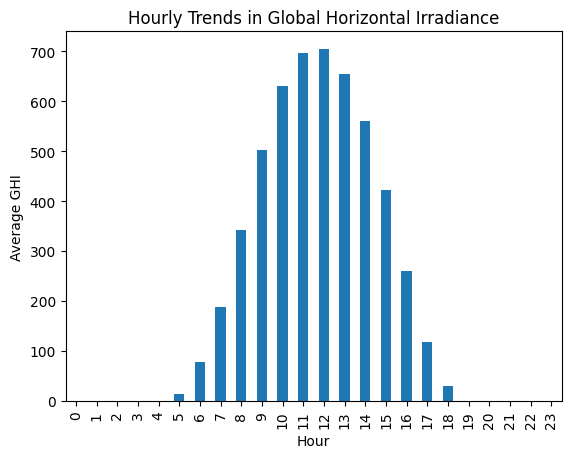

In [ ]:
almeda.groupby('Hour')['GHI'].mean().plot(kind='bar')
plt.ylabel('Average GHI')
plt.title('Hourly Trends in Global Horizontal Irradiance')
plt.show()

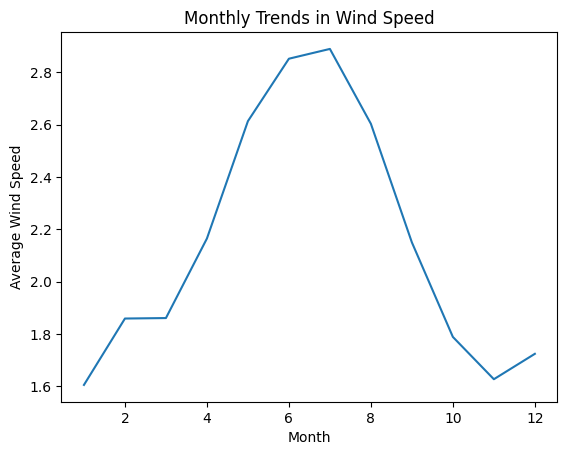

In [ ]:
almeda.groupby('Month')['Wind Speed'].mean().plot(kind='line')
plt.ylabel('Average Wind Speed')
plt.title('Monthly Trends in Wind Speed')
plt.show()

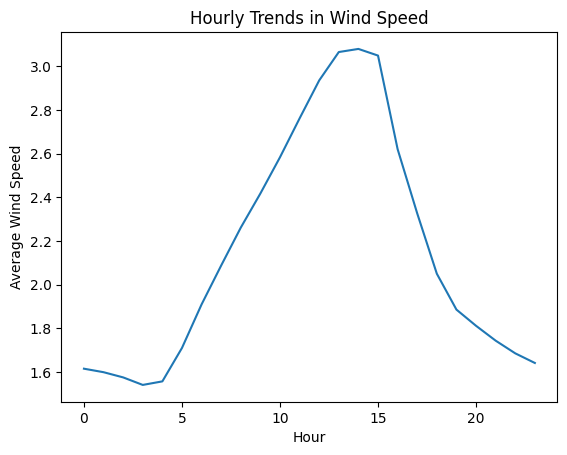

In [ ]:
almeda.groupby('Hour')['Wind Speed'].mean().plot(kind='line')
plt.ylabel('Average Wind Speed')
plt.title('Hourly Trends in Wind Speed')
plt.show()

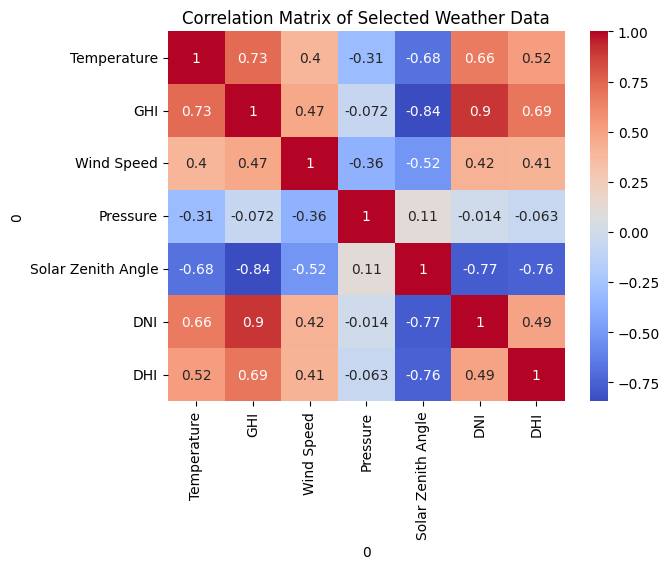

In [ ]:
cols = ['Temperature', 'GHI', 'Wind Speed', 'Pressure', 'Solar Zenith Angle', 'DNI', 'DHI']
corr_matrix = almeda[cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Selected Weather Data')
plt.show()

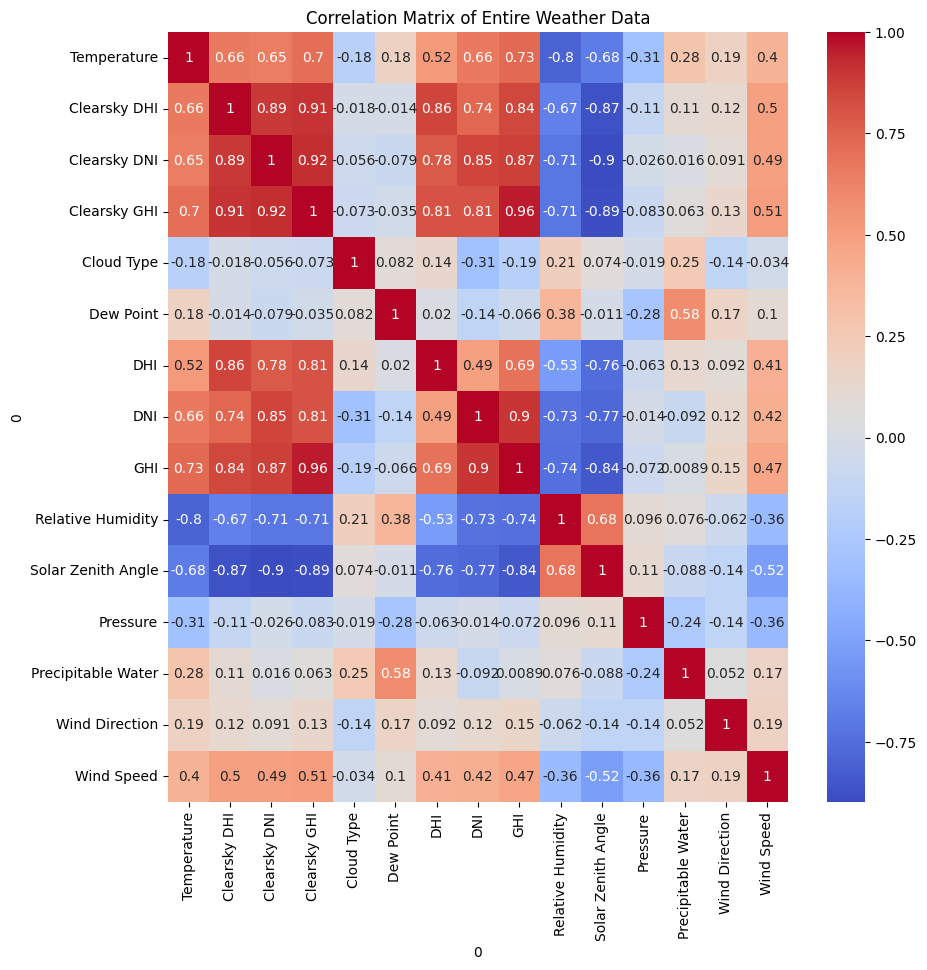

In [ ]:
# Select relevant columns
cols = ['Temperature', 'Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI', 'Cloud Type',
        'Dew Point', 'DHI', 'DNI', 'GHI', 'Relative Humidity', 'Solar Zenith Angle',
        'Pressure', 'Precipitable Water', 'Wind Direction', 'Wind Speed']

# Calculate correlation matrix
corr_matrix = almeda[cols].corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Entire Weather Data')
plt.show()

In [ ]:
df = almeda.groupby('Hour')['GHI'].mean().reset_index()
fig = px.line(df, x='Hour', y='GHI', title='Hourly Trends in Global Horizontal Irradiance')
fig.show()

In [ ]:
fig = px.scatter_3d(almeda, x='Temperature', y='GHI', z='Wind Speed')
fig.show()

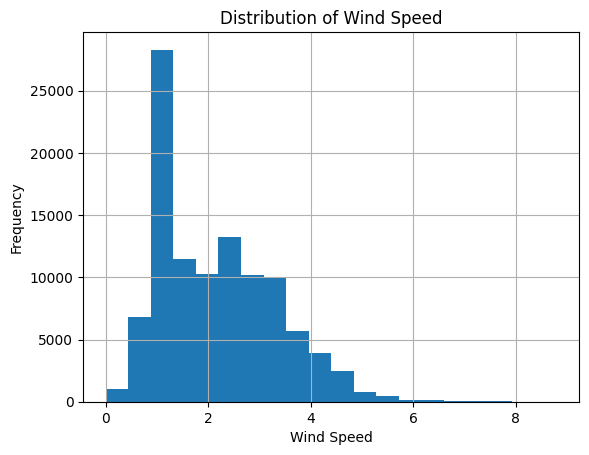

In [ ]:
almeda['Wind Speed'].hist(bins=20)
plt.title('Distribution of Wind Speed')
plt.xlabel('Wind Speed')
plt.ylabel('Frequency')
plt.show()

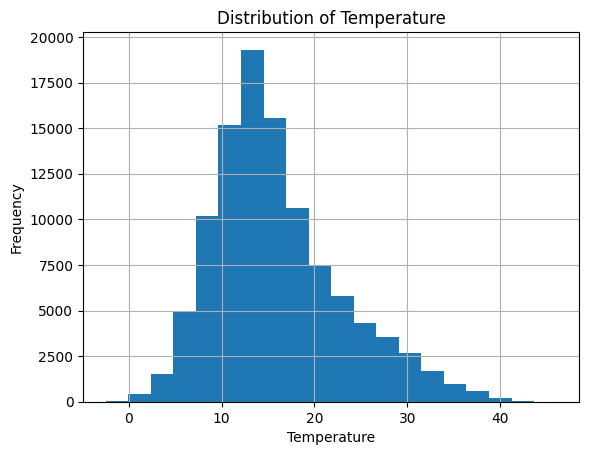

In [ ]:
almeda['Temperature'].hist(bins=20)
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.show()

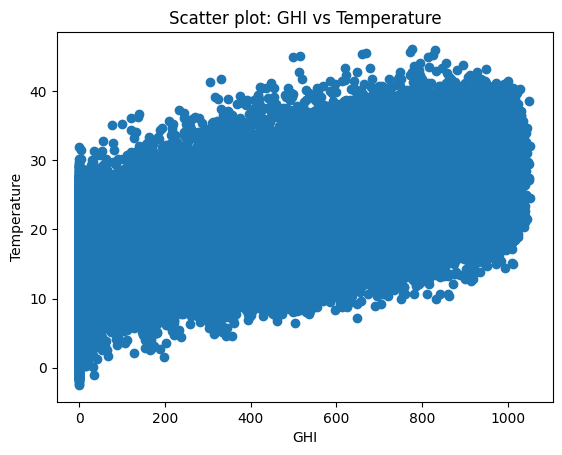

In [ ]:
plt.scatter(almeda['GHI'], almeda['Temperature'])
plt.xlabel('GHI')
plt.ylabel('Temperature')
plt.title('Scatter plot: GHI vs Temperature')
plt.show()

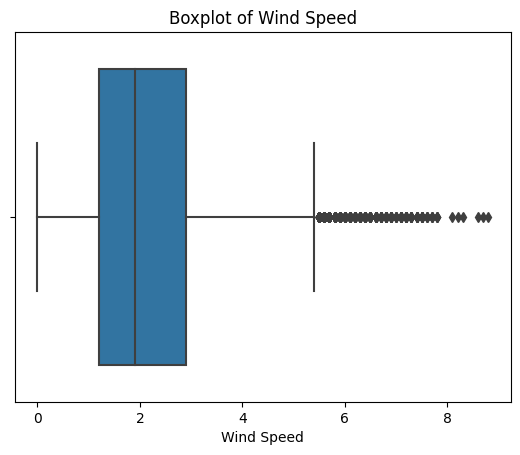

In [ ]:
sns.boxplot(x=almeda['Wind Speed'])
plt.title('Boxplot of Wind Speed')
plt.show()

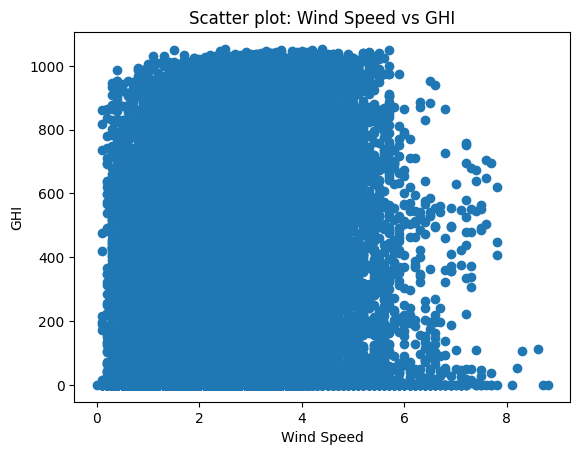

In [ ]:
plt.scatter(almeda['Wind Speed'], almeda['GHI'])
plt.xlabel('Wind Speed')
plt.ylabel('GHI')
plt.title('Scatter plot: Wind Speed vs GHI')
plt.show()

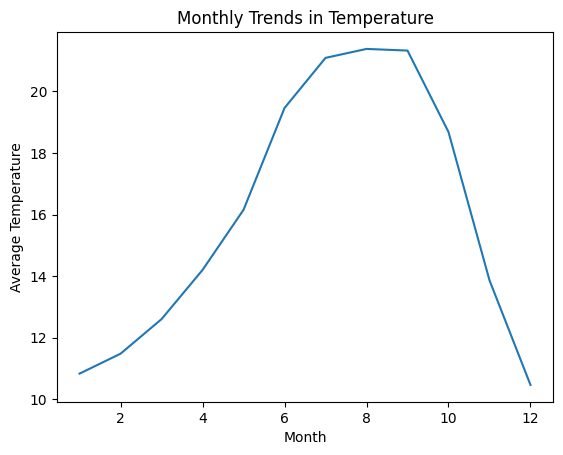

In [ ]:
almeda.groupby('Month')['Temperature'].mean().plot(kind='line')
plt.ylabel('Average Temperature')
plt.title('Monthly Trends in Temperature')
plt.show()

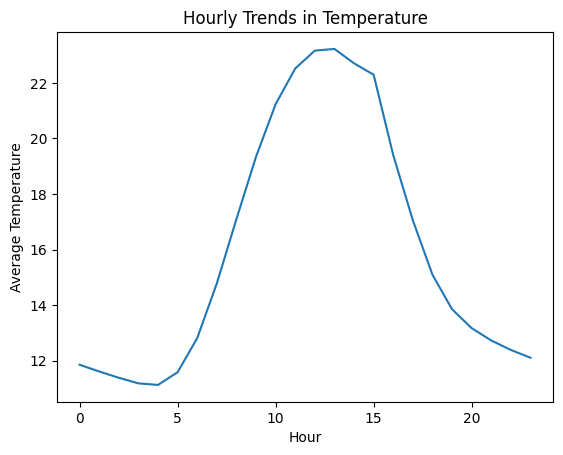

In [ ]:
almeda.groupby('Hour')['Temperature'].mean().plot(kind='line')
plt.ylabel('Average Temperature')
plt.title('Hourly Trends in Temperature')
plt.show()

##Comparison

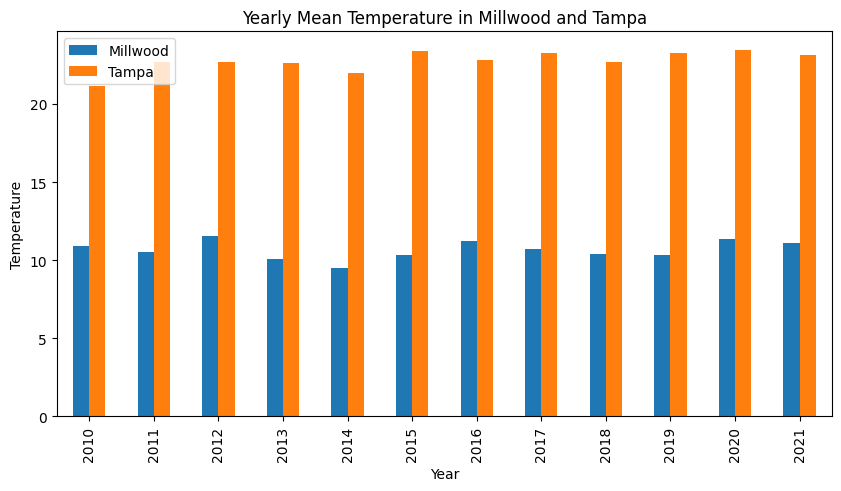

In [ ]:
# Group data by Year and calculate mean temperature
millwood_yearly_avg_temp = millwood_copy.groupby(millwood_copy.index.year)['Temperature'].mean()
tampa_yearly_avg_temp = tampa_copy.groupby(tampa_copy.index.year)['Temperature'].mean()

# Create a dataframe to store the yearly average temperature data
yearly_avg_temp = pd.DataFrame({'Millwood': millwood_yearly_avg_temp, 'Tampa': tampa_yearly_avg_temp})

# Plot
yearly_avg_temp.plot(kind='bar', figsize=(10, 5))
plt.title('Yearly Mean Temperature in Millwood and Tampa')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.show()

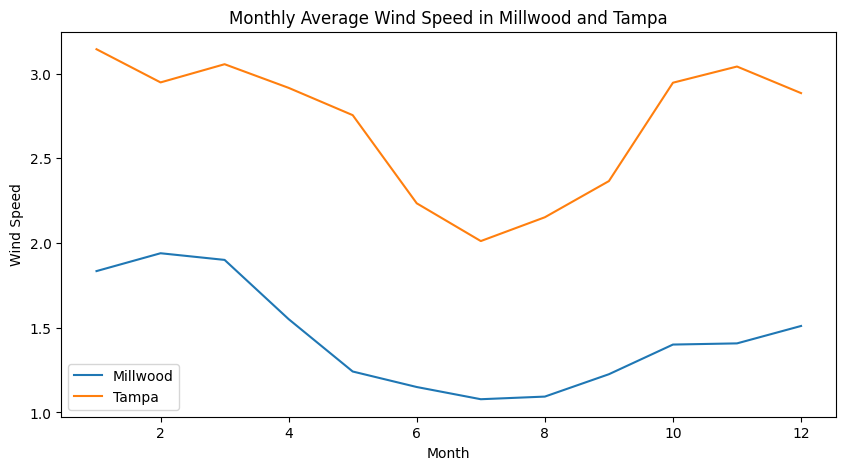

In [ ]:
# Group data by Month and calculate mean wind speed
millwood_monthly_avg_wind = millwood_copy.groupby(millwood_copy.index.month)['Wind Speed'].mean()
tampa_monthly_avg_wind = tampa_copy.groupby(tampa_copy.index.month)['Wind Speed'].mean()

# Create a dataframe to store the monthly average wind speed data
monthly_avg_wind = pd.DataFrame({'Millwood': millwood_monthly_avg_wind, 'Tampa': tampa_monthly_avg_wind})

# Plot
monthly_avg_wind.plot(kind='line', figsize=(10, 5))
plt.title('Monthly Average Wind Speed in Millwood and Tampa')
plt.xlabel('Month')
plt.ylabel('Wind Speed')
plt.show()

<ipython-input-68-02908e8646bd>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-68-02908e8646bd>:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




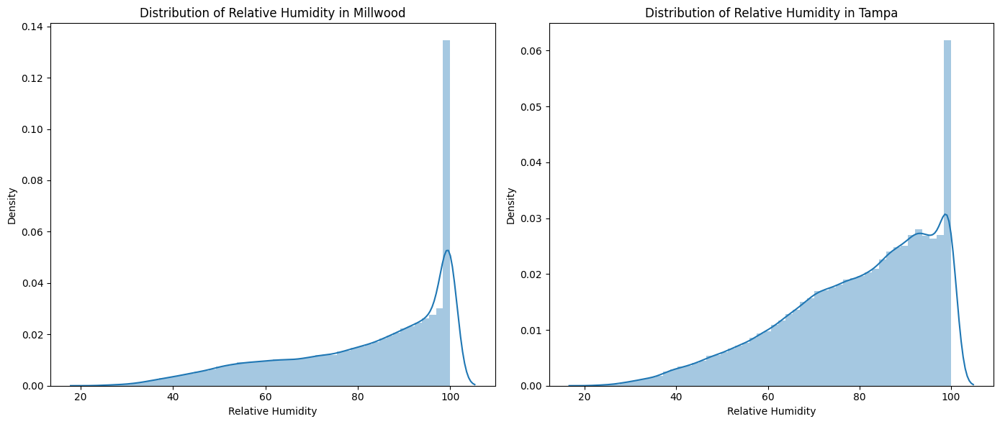

In [ ]:
# Using Seaborn's distplot
import seaborn as sns

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.distplot(millwood_copy['Relative Humidity'])
plt.title('Distribution of Relative Humidity in Millwood')

plt.subplot(1, 2, 2)
sns.distplot(tampa_copy['Relative Humidity'])
plt.title('Distribution of Relative Humidity in Tampa')

plt.tight_layout()
plt.show()

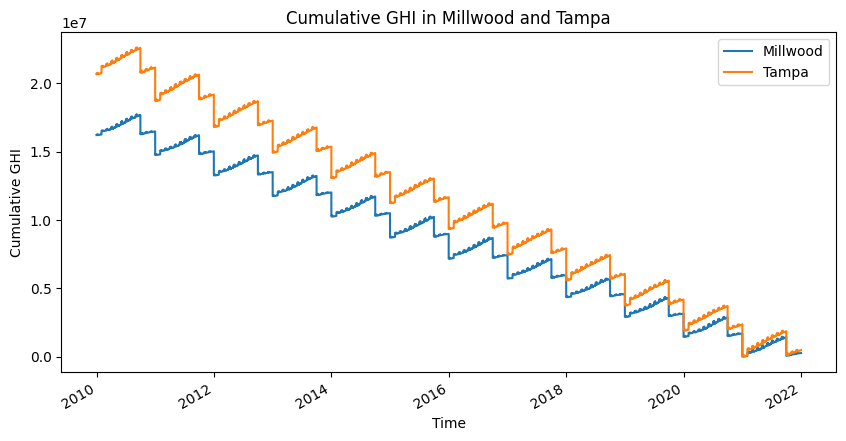

In [ ]:
# Cumulative sum of GHI
millwood_cumulative_GHI = millwood_copy['GHI'].cumsum()
tampa_cumulative_GHI = tampa_copy['GHI'].cumsum()

# Create a dataframe to store the cumulative GHI data
cumulative_GHI = pd.DataFrame({'Millwood': millwood_cumulative_GHI, 'Tampa': tampa_cumulative_GHI})

# Plot
cumulative_GHI.plot(kind='line', figsize=(10, 5))
plt.title('Cumulative GHI in Millwood and Tampa')
plt.xlabel('Time')
plt.ylabel('Cumulative GHI')
plt.show()

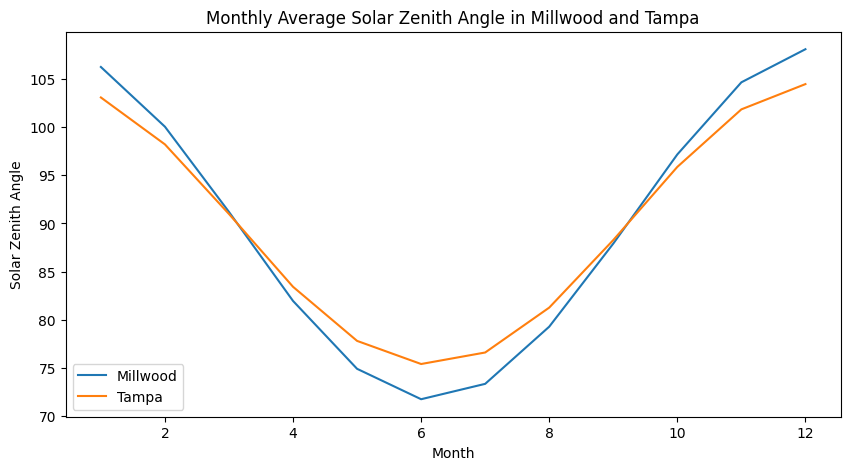

In [ ]:
# Group data by Month and calculate mean solar zenith angle
millwood_monthly_avg_sza = millwood_copy.groupby(millwood_copy.index.month)['Solar Zenith Angle'].mean()
tampa_monthly_avg_sza = tampa_copy.groupby(tampa_copy.index.month)['Solar Zenith Angle'].mean()

# Create a dataframe to store the monthly average solar zenith angle data
monthly_avg_sza = pd.DataFrame({'Millwood': millwood_monthly_avg_sza, 'Tampa': tampa_monthly_avg_sza})

# Plot
monthly_avg_sza.plot(kind='line', figsize=(10, 5))
plt.title('Monthly Average Solar Zenith Angle in Millwood and Tampa')
plt.xlabel('Month')
plt.ylabel('Solar Zenith Angle')
plt.show()

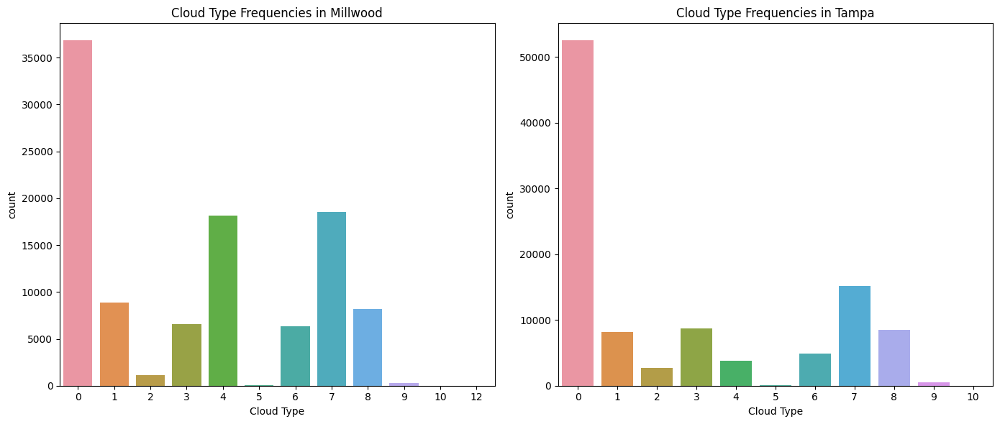

In [ ]:
import seaborn as sns

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot for Millwood
sns.countplot(ax=axes[0], x='Cloud Type', data=millwood_copy)
axes[0].set_title('Cloud Type Frequencies in Millwood')

# Plot for Tampa
sns.countplot(ax=axes[1], x='Cloud Type', data=tampa_copy)
axes[1].set_title('Cloud Type Frequencies in Tampa')

plt.tight_layout()
plt.show()

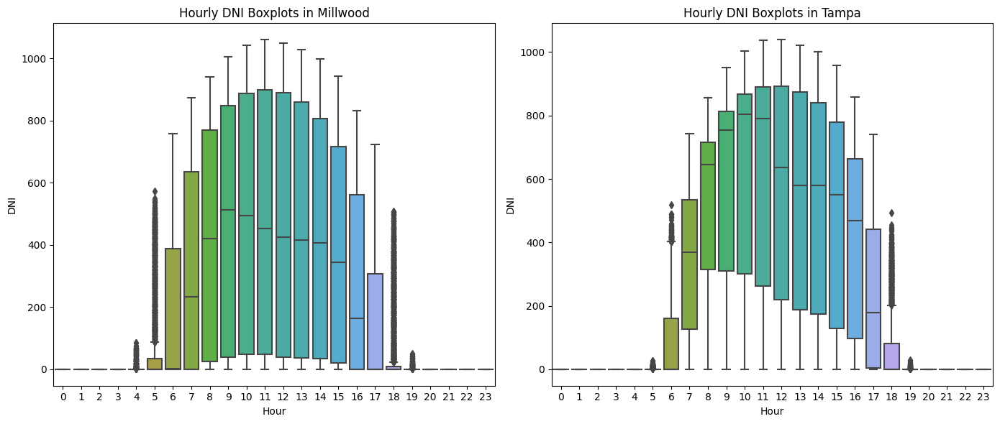

In [ ]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=millwood_copy.index.hour, y='DNI', data=millwood_copy)
plt.title('Hourly DNI Boxplots in Millwood')
plt.xlabel('Hour')
plt.ylabel('DNI')

plt.subplot(1, 2, 2)
sns.boxplot(x=tampa_copy.index.hour, y='DNI', data=tampa_copy)
plt.title('Hourly DNI Boxplots in Tampa')
plt.xlabel('Hour')
plt.ylabel('DNI')

plt.tight_layout()
plt.show()

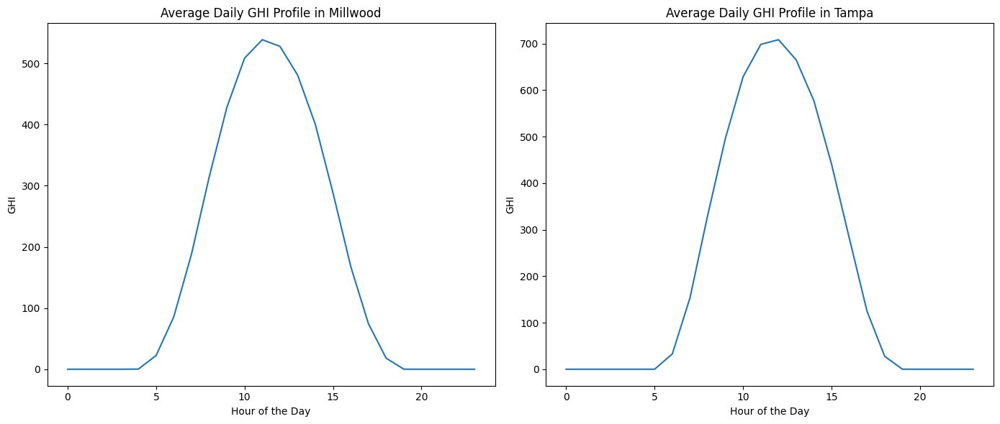

In [ ]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
millwood_copy.groupby(millwood_copy.index.hour)['GHI'].mean().plot()
plt.title('Average Daily GHI Profile in Millwood')
plt.xlabel('Hour of the Day')
plt.ylabel('GHI')

plt.subplot(1, 2, 2)
tampa_copy.groupby(tampa_copy.index.hour)['GHI'].mean().plot()
plt.title('Average Daily GHI Profile in Tampa')
plt.xlabel('Hour of the Day')
plt.ylabel('GHI')

plt.tight_layout()
plt.show()

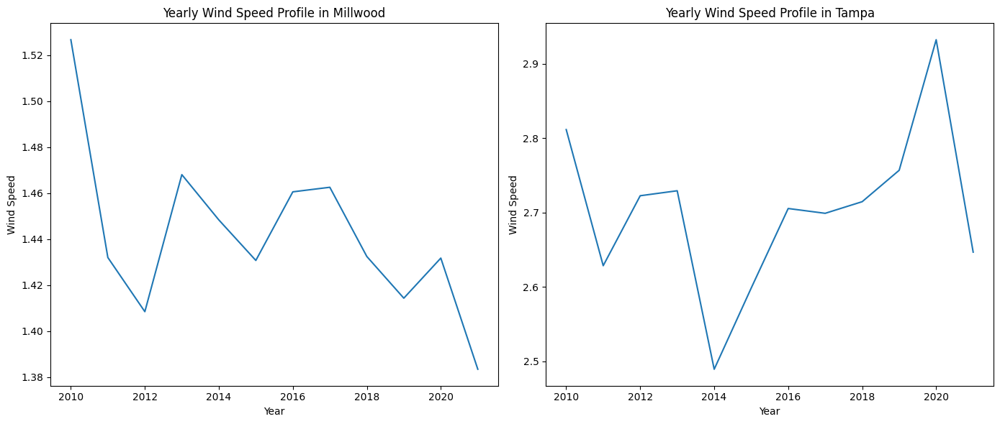

In [ ]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
millwood_copy.groupby(millwood_copy.index.year)['Wind Speed'].mean().plot()
plt.title('Yearly Wind Speed Profile in Millwood')
plt.xlabel('Year')
plt.ylabel('Wind Speed')

plt.subplot(1, 2, 2)
tampa_copy.groupby(tampa_copy.index.year)['Wind Speed'].mean().plot()
plt.title('Yearly Wind Speed Profile in Tampa')
plt.xlabel('Year')
plt.ylabel('Wind Speed')

plt.tight_layout()
plt.show()

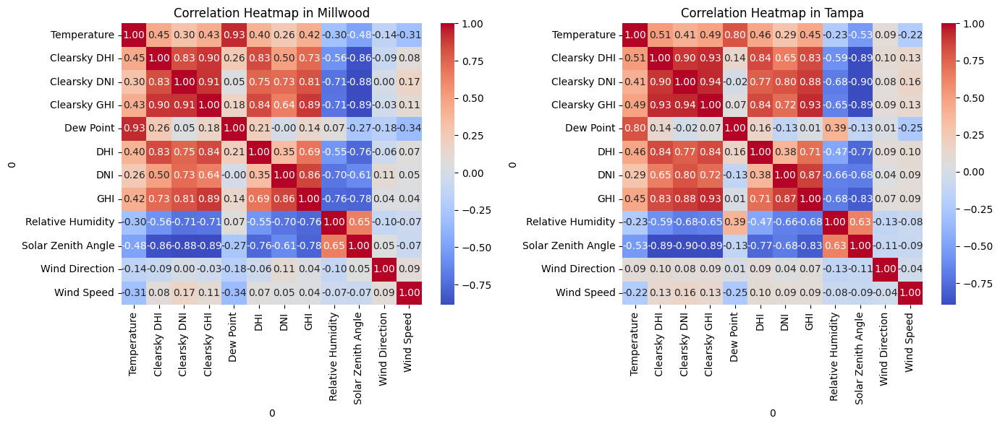

In [ ]:
# List of columns for correlation analysis
cols = ['Temperature', 'Clearsky DHI', 'Clearsky DNI', 'Clearsky GHI', 'Dew Point', 'DHI', 'DNI', 'GHI', 'Relative Humidity', 'Solar Zenith Angle', 'Wind Direction', 'Wind Speed']

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.heatmap(millwood_copy[cols].corr(), cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Correlation Heatmap in Millwood')

plt.subplot(1, 2, 2)
sns.heatmap(tampa_copy[cols].corr(), cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Correlation Heatmap in Tampa')

plt.tight_layout()
plt.show()

#Loss Function

In [ ]:
def loss_function(decision_variables, constants):
    Npv, Nw, Ncsp, Ng, Nh, Nbatt, Nh2, PFC, Ninv, Nfc, Nbus = decision_variables
    ρ, A, v, Cp, Prate_pv, S, Sref, Kt, Tc, Tref, G, η, CF, m, c, ΔT, h, Q, FCR, CAPEX, FOM, VOM, FUEL = constants

    # Calculate the total energy produced based on your decision variables
    P_wind = 0.5 * ρ * A * v**3 * Cp
    P_pv = Npv * Prate_pv * S/Sref * [1- Kt*(Tc - Tref)]
    P_csp = A * G * η * CF
    P_geo = m * c * ΔT
    P_hydro = η * ρ * g * h * Q
    total_energy = P_wind + P_pv + P_csp + P_geo + P_hydro

    # Calculate the total cost based on your decision variables
    total_cost = (FCR * CAPEX + FOM) / (CF * 8760) + VOM + FUEL

    # Define your energy quota
    energy_quota = ...

    # If the total energy produced is less than the quota, return a large loss value
    if total_energy < energy_quota:
        return float('inf')

    # Otherwise, return the total cost
    return total_cost